## 2 - Export Data Assessment (Fixation on Surface)

##### Imports

In [1]:
import os
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [2]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=False):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data [file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata): # Manually read the column
    output = []
    for line in filedata.split('\n'): # split into lines
        line = line.strip().rstrip(']').lstrip('[') #remove whitespace and brackets
        if not line:  
            continue    #skip empty lines
        line = line.split() #split into cell
        row = []
        for cell in line:
            cell = cell.strip()     #remove whitespace
            if not cell.strip():
                continue    #skip empty cells
            row.append(float(cell)) #convert to float and add
        output.append(row)
    return output
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)

In [3]:
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
ddf = data['all_fixations_on_surface_HiDrive_Studie2'].iloc[:, 1:]
df = ddf.compute()

In [ ]:
#  Fixation are repeated base on how many world_indexes they cover
#   (ex: 3 indexes covered-> row copied 3 times with only the 'world_index' column changing)
# Aggregate by participant and fixation_id + save indexes in a list 
df = df.groupby(['participant_id', 'fixation_id']).agg({
    'world_timestamp': 'first',
    'start_timestamp': 'first',
    'duration': 'first',
    'dispersion': 'first',
    'norm_pos_x': 'first',
    'norm_pos_y': 'first',
    'x_scaled': 'first',
    'y_scaled': 'first',
    'on_surf': 'first',
    'world_index': lambda x: list(x)  # Aggregate world_index into a list
}).reset_index()

# Rename the aggregated world_index column to world_indexes
df = df.rename(columns={'world_index': 'world_indexes'})
ddf = dd.from_pandas(df, npartitions=2)

### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail
- Repeated values according to how many word_index they cover => computation after data loading

In [5]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
0,0,-672842.718256,-672842.855135,82.0765,1.019674,0.357391,0.812998,0.357391,0.812998,True,[0]
1,1,-672842.718256,-672842.769080,148.1535,1.212507,0.343279,0.811879,0.343279,0.811879,True,"[0, 1]"
2,2,-672842.635488,-672842.609103,80.0720,1.385789,0.308002,0.810504,0.308002,0.810504,True,"[1, 2, 3]"
3,3,-672842.534939,-672842.523645,218.5675,1.180783,0.318434,0.826189,0.318434,0.826189,True,"[3, 4, 5, 6, 7, 8, 9, 10]"
4,4,-672842.306190,-672842.301084,93.2860,1.036320,0.313444,0.799379,0.313444,0.799379,True,"[10, 11, 12, 13]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
20164,20176,-668800.210994,-668800.214094,83.986,1.453803,0.324247,0.340974,0.324247,0.340974,True,"[116935, 116936, 116937]"
20165,20177,-668800.111092,-668800.126107,148.018,1.430637,0.320945,0.343497,0.320945,0.343497,True,"[116938, 116939, 116940, 116941, 116942]"
20166,20178,-668799.979130,-668799.974053,219.912,1.277702,0.314396,0.309322,0.314396,0.309322,True,"[116942, 116943, 116944, 116945, 116946, 11694..."
20167,20179,-668799.743125,-668799.750137,216.024,0.573793,0.319638,0.317285,0.319638,0.317285,True,"[116949, 116950, 116951, 116952, 116953, 11695..."
20168,20180,-668799.543128,-668799.530128,216.006,1.094980,0.315520,0.321414,0.315520,0.321414,True,"[116955, 116956, 116957, 116958, 116959, 11696..."


'Participant 2'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
20169,0,-664549.394440,-664549.411054,132.0735,1.475932,0.349530,0.593456,0.349530,0.593456,True,"[0, 1, 2]"
20170,1,-664549.175198,-664549.167066,98.0655,1.428618,0.538079,0.871210,0.538079,0.871210,True,"[5, 6, 7, 8]"
20171,2,-664549.042691,-664549.035020,95.9920,1.349427,0.642048,0.962017,0.642048,0.962017,True,"[9, 10, 11, 12]"
20172,3,-664548.808294,-664548.799011,108.0520,1.446544,0.637636,0.458100,0.637636,0.458100,True,"[16, 17, 18, 19, 20]"
20173,4,-664548.677962,-664548.686991,106.0485,1.296692,0.664157,0.447510,0.664157,0.447510,True,"[20, 21, 22, 23]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
35770,15618,-661486.656554,-661486.650288,90.0955,1.026307,0.293942,0.953357,0.293942,0.953357,True,"[89984, 89985, 89986, 89987]"
35771,15619,-661486.558843,-661486.548118,87.8775,1.308365,0.321323,0.998476,0.321323,0.998476,True,"[89987, 89988, 89989, 89990]"
35772,15620,-661486.357099,-661486.356165,181.9160,1.485863,0.311268,0.541250,0.311268,0.541250,True,"[89993, 89994, 89995, 89996, 89997, 89998, 89999]"
35773,15621,-661485.584727,-661485.588267,92.6600,1.470206,0.845604,0.105744,0.845604,0.105744,True,"[90016, 90017, 90018, 90019]"
35774,15622,-661485.482055,-661485.473982,81.7245,1.468326,0.831622,0.097445,0.831622,0.097445,True,"[90019, 90020, 90021, 90022]"


'Participant 4'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
35775,0,-587761.674974,-587761.779642,217.7145,1.221079,0.481404,0.945382,0.481404,0.945382,True,"[0, 1, 2]"
35776,1,-587761.546448,-587761.557930,217.7975,0.703759,0.478194,0.945835,0.478194,0.945835,True,"[2, 3, 4, 5, 6, 7]"
35777,2,-587761.350170,-587761.336120,218.0500,1.315270,0.471743,0.931137,0.471743,0.931137,True,"[7, 8, 9, 10, 11, 12, 13]"
35778,3,-587761.096214,-587761.114027,217.9465,1.384675,0.489253,0.942638,0.489253,0.942638,True,"[14, 15, 16, 17, 18, 19, 20]"
35779,4,-587760.881977,-587760.892013,218.2080,0.564100,0.488472,0.950630,0.488472,0.950630,True,"[20, 21, 22, 23, 24, 25]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
50718,14943,-584621.178558,-584621.187555,80.4040,1.368042,0.288784,0.878210,0.288784,0.878210,True,"[81033, 81034, 81035]"
50719,14944,-584621.110573,-584621.103486,182.2085,1.215676,0.295513,0.892318,0.295513,0.892318,True,"[81035, 81036, 81037, 81038, 81039, 81040, 81041]"
50720,14945,-584620.673712,-584620.667593,85.2070,0.703529,0.237289,0.113795,0.237289,0.113795,True,"[81048, 81049, 81050, 81051]"
50721,14946,-584620.138461,-584620.143528,148.0010,1.074297,0.422932,-1.761928,0.422932,-1.761928,False,"[81064, 81065, 81066, 81067]"
50722,14947,-584619.633978,-584619.624441,148.7960,0.505237,0.349616,-1.110181,0.349616,-1.110181,False,"[81079, 81081, 81082, 81083, 81084]"


'Participant 5'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
50723,0,-578913.041447,-578913.168452,129.9825,1.481941,0.368109,0.424182,0.368109,0.424182,True,[0]
50724,1,-578913.041447,-578913.034458,99.9995,0.778583,0.373562,0.405133,0.373562,0.405133,True,"[0, 1]"
50725,2,-578912.906891,-578912.911137,219.6005,0.992084,0.363704,0.399115,0.363704,0.399115,True,"[2, 3, 4, 5, 6, 7, 8]"
50726,3,-578912.653432,-578912.658456,207.9205,1.186978,0.353752,0.393114,0.353752,0.393114,True,"[9, 10, 11, 12, 13, 14, 15]"
50727,4,-578912.450747,-578912.442457,145.8925,1.486089,0.347541,0.451598,0.347541,0.451598,True,"[15, 16, 17, 18, 19, 20]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
67983,17322,-575206.032479,-575206.021875,90.4875,1.378160,0.521211,0.395963,0.521211,0.395963,True,"[100800, 100801, 100802, 100803]"
67984,17323,-575205.925035,-575205.927444,99.5640,1.355838,0.512091,0.373981,0.512091,0.373981,True,"[100803, 100804, 100805, 100806]"
67985,17324,-575205.788892,-575205.803703,109.8245,1.475158,0.506809,0.274998,0.506809,0.274998,True,"[100807, 100808, 100809, 100810]"
67986,17325,-575205.692287,-575205.689918,84.0480,1.337434,0.509063,0.249337,0.509063,0.249337,True,"[100810, 100811, 100812]"
67987,17326,-575204.324888,-575204.313881,83.9015,1.388146,3.806648,-3.224214,3.806648,-3.224214,False,"[100849, 100850, 100852]"


'Participant 6'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
67988,0,82162.352004,82162.351230,96.0700,1.474356,0.236064,0.846798,0.236064,0.846798,True,"[3, 4, 5, 6]"
67989,1,82162.446084,82162.451296,105.9035,0.839592,0.235962,0.862132,0.235962,0.862132,True,"[6, 7, 8, 9, 10]"
67990,2,82162.604225,82162.589374,217.8960,1.124163,0.340750,0.948496,0.340750,0.948496,True,"[11, 12, 13, 14, 15, 16, 17]"
67991,3,82162.940188,82162.933389,219.8840,1.423748,0.222789,1.481971,0.222789,1.481971,False,"[21, 22, 23, 24, 25, 26, 27]"
67992,4,82163.376426,82163.383212,138.0665,1.422107,0.561824,0.578922,0.561824,0.578922,True,"[34, 35, 36, 37, 38]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
84084,16108,85413.782398,85413.777830,195.5490,1.346463,-5.109830,-0.605388,-5.109830,-0.605388,False,"[96727, 96728, 96729, 96730, 96731, 96732, 96733]"
84085,16109,85414.118307,85414.125348,127.9345,1.495174,-21.141548,4.959015,-21.141548,4.959015,False,"[96737, 96738, 96739, 96740, 96741]"
84086,16110,85414.318347,85414.325334,219.9870,1.082816,-5.380472,-0.015660,-5.380472,-0.015660,False,"[96743, 96744, 96745, 96746, 96747, 96748, 967..."
84087,16111,85414.554322,85414.549342,180.0080,0.973619,-4.694235,0.034103,-4.694235,0.034103,False,"[96750, 96751, 96752, 96753, 96754, 96755]"
84088,16112,85415.290401,85415.277354,119.9930,1.494746,0.078513,-0.420871,0.078513,-0.420871,False,"[96772, 96773, 96774, 96775]"


'Participant 7'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


'Participant 8'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
84089,0,4131.593964,4131.476601,86.0200,0.951474,0.619279,0.416319,0.619279,0.416319,True,[0]
84090,1,4131.593964,4131.658653,101.9725,1.103937,0.767944,0.938586,0.767944,0.938586,True,[0]
84091,2,4131.593964,4131.768617,178.0000,1.186568,0.799734,0.959289,0.799734,0.959289,True,[0]
84092,3,4132.337544,4132.006637,160.0400,1.358584,0.624232,0.962573,0.624232,0.962573,True,[1]
84093,4,4132.337544,4132.228612,218.0135,1.469664,0.303119,0.904947,0.303119,0.904947,True,"[1, 2]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
96900,12813,7343.700386,7343.703983,128.0295,0.783071,0.376851,0.849884,0.376851,0.849884,True,"[95801, 95802, 95803, 95804, 95805]"
96901,12814,7343.834936,7343.850087,217.9155,1.360154,0.415158,0.775173,0.415158,0.775173,True,"[95805, 95806, 95807, 95808, 95809, 95810, 958..."
96902,12815,7344.066977,7344.071966,189.8175,1.226896,0.383848,0.788211,0.383848,0.788211,True,"[95812, 95813, 95814, 95815, 95816, 95817, 95818]"
96903,12816,7344.334951,7344.322018,181.9705,1.491510,0.538602,0.814473,0.538602,0.814473,True,"[95820, 95821, 95822, 95823, 95824, 95825]"
96904,12817,7344.504425,7344.512133,218.2570,1.053427,0.524519,0.803255,0.524519,0.803255,True,"[95825, 95826, 95827, 95828, 95829, 95830, 958..."


'Participant 9'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


'Participant 10'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
96905,0,5423.373465,5422.838551,216.1075,1.333122,0.928118,0.973614,0.928118,0.973614,True,[0]
96906,1,5423.373465,5423.058665,179.9145,0.764595,0.924233,0.983590,0.924233,0.983590,True,[0]
96907,2,5423.373465,5423.318582,104.0890,1.391338,0.852888,0.587280,0.852888,0.587280,True,[0]
96908,3,5423.564303,5423.558621,195.9220,1.483534,1.077303,-0.002629,1.077303,-0.002629,False,"[2, 3, 4, 5, 6, 7, 8]"
96909,4,5423.771594,5423.758540,112.0070,1.070243,1.109482,-0.026506,1.109482,-0.026506,False,"[9, 10, 11, 12]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
112814,15945,8721.262648,8721.260496,97.1195,1.499890,0.671652,-2.560720,0.671652,-2.560720,False,"[98343, 98344, 98345, 98346]"
112815,15946,8721.799999,8721.791693,115.8975,1.129350,-8.897483,320.740936,-8.897483,320.740936,False,"[98359, 98360, 98361, 98362]"
112816,15947,8722.502599,8722.495624,111.5935,1.370370,1.676640,-14.268909,1.676640,-14.268909,False,"[98380, 98381, 98382, 98383]"
112817,15948,8722.706662,8722.693618,86.2650,1.348133,1.772642,-16.187752,1.772642,-16.187752,False,"[98386, 98387, 98388]"
112818,15949,8723.342633,8723.348737,142.3610,1.371140,0.892338,-8.332535,0.892338,-8.332535,False,"[98405, 98406, 98407, 98408, 98409]"


'Participant 11'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
112819,0,16541.754802,16540.941312,112.0090,0.956585,0.589207,0.524153,0.589207,0.524153,True,[0]
112820,1,16541.754802,16541.061328,83.9650,1.467990,0.547601,0.522804,0.547601,0.522804,True,[0]
112821,2,16541.754802,16541.149449,179.9145,1.391245,0.546723,0.523690,0.546723,0.523690,True,[0]
112822,3,16541.754802,16541.333336,204.0125,1.388246,0.571116,0.531606,0.571116,0.531606,True,[0]
112823,4,16541.754802,16541.633343,147.9840,1.396129,0.592801,0.871321,0.592801,0.871321,True,[0]


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
128801,15989,19777.263369,19777.260150,84.1955,1.324323,-2.259699,1.841238,-2.259699,1.841238,False,"[96493, 96494, 96495]"
128802,15990,19779.675443,19779.660355,80.0150,1.431383,-0.726251,-2.997183,-0.726251,-2.997183,False,"[96565, 96566, 96567]"
128803,15991,19780.079355,19780.074354,82.0635,1.352027,-0.262824,0.098042,-0.262824,0.098042,False,"[96577, 96578, 96579]"
128804,15992,19780.247364,19780.230332,144.0530,1.426447,-0.000299,0.447090,-0.000299,0.447090,False,"[96582, 96583, 96584, 96585, 96586]"
128805,15993,19781.051367,19781.064486,109.8595,1.388805,0.690946,0.773685,0.690946,0.773685,True,"[96606, 96607, 96608, 96609, 96610]"


'Participant 12'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
128806,0,84204.801048,84204.810431,155.9980,1.498035,0.481564,0.691322,0.481564,0.691322,True,"[3, 4, 5, 6, 7, 8]"
128807,1,84204.972082,84204.970396,98.0615,1.344934,0.484099,0.688531,0.484099,0.688531,True,"[8, 9, 10, 11]"
128808,2,84205.063413,84205.072494,109.9475,1.345436,0.486017,0.669856,0.486017,0.669856,True,"[11, 12, 13, 14]"
128809,3,84205.198189,84205.186475,119.9160,1.230254,0.497278,0.678690,0.497278,0.678690,True,"[14, 15, 16, 17]"
128810,4,84205.331400,84205.318361,88.0595,1.499204,0.461536,0.650442,0.461536,0.650442,True,"[18, 19, 20]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
145340,16538,87441.164980,87441.166078,159.8630,1.466380,0.438980,0.701115,0.438980,0.701115,True,"[96541, 96542, 96543, 96544, 96545, 96546]"
145341,16539,87441.332969,87441.337960,219.9890,1.379894,0.473303,0.712450,0.473303,0.712450,True,"[96546, 96547, 96548, 96549, 96550, 96551, 965..."
145342,16540,87441.568953,87441.561960,88.0065,1.431123,0.473789,0.715181,0.473789,0.715181,True,"[96553, 96554, 96555]"
145343,16541,87441.668975,87441.654063,219.9450,1.385048,0.463308,0.733501,0.463308,0.733501,True,"[96556, 96557, 96558, 96559, 96560, 96561, 96562]"
145344,16542,87441.900996,87441.898024,116.0615,1.444153,0.460250,0.693242,0.460250,0.693242,True,"[96563, 96564, 96565, 96566]"


'Participant 13'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
145345,0,93626.211839,93626.060882,216.0520,0.632402,0.491707,0.581700,0.491707,0.581700,True,[0]
145346,1,93626.211839,93626.280926,219.9370,0.732309,0.491908,0.572494,0.491908,0.572494,True,[0]
145347,2,93626.211839,93626.504880,219.9835,0.860619,0.500175,0.576313,0.500175,0.576313,True,"[0, 1]"
145348,3,93626.951498,93626.728840,216.0280,0.448077,0.501800,0.581439,0.501800,0.581439,True,[1]
145349,4,93626.951498,93626.948869,216.0365,0.852188,0.498297,0.593928,0.498297,0.593928,True,"[1, 2, 3, 4]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
163917,18665,97299.757653,97299.752675,87.9695,1.362841,0.355573,0.631167,0.355573,0.631167,True,"[109543, 109544, 109545]"
163918,18666,97299.861654,97299.848670,218.0265,1.295225,0.327288,0.591635,0.327288,0.591635,True,"[109546, 109547, 109548, 109549, 109550, 10955..."
163919,18667,97300.061695,97300.070661,86.0835,0.755021,0.322953,0.580957,0.322953,0.580957,True,"[109552, 109553, 109554, 109555]"
163920,18668,97300.193634,97300.192904,83.7550,0.880050,0.343075,0.659516,0.343075,0.659516,True,"[109556, 109557, 109558]"
163921,18669,97300.293640,97300.280708,217.9520,0.997353,0.332010,0.710121,0.332010,0.710121,True,"[109559, 109560, 109561, 109562, 109563, 10956..."


'Participant 14'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


'Participant 15'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes


'Participant 16'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
163922,0,87725.767887,87725.672077,80.3670,0.662213,0.514364,0.551033,0.514364,0.551033,True,[0]
163923,1,87725.767887,87725.756113,126.0015,1.445862,0.534079,0.564190,0.534079,0.564190,True,[0]
163924,2,87725.767887,87725.886091,80.0570,0.493195,0.520302,0.567250,0.520302,0.567250,True,[0]
163925,3,87725.767887,87725.994108,217.9640,1.210888,0.609828,0.813798,0.609828,0.813798,True,"[0, 1]"
163926,4,87726.508911,87726.216071,114.1035,0.265199,0.608016,0.830554,0.608016,0.830554,True,[1]


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
182224,18307,91477.618954,91477.626576,218.0315,1.224011,0.366576,0.812123,0.366576,0.812123,True,"[111882, 111883, 111884, 111885, 111886, 11188..."
182225,18308,91477.883596,91477.876595,202.0415,1.425882,0.402962,0.822685,0.402962,0.822685,True,"[111890, 111891, 111892, 111893, 111894, 11189..."
182226,18309,91478.083568,91478.090583,218.0890,0.744268,0.354978,0.800559,0.354978,0.800559,True,"[111896, 111897, 111898, 111899, 111900, 11190..."
182227,18310,91478.319604,91478.312633,217.9370,0.809232,0.338914,0.788108,0.338914,0.788108,True,"[111903, 111904, 111905, 111906, 111907, 11190..."
182228,18311,91478.552061,91478.562622,122.0035,1.407085,0.406742,0.670435,0.406742,0.670435,True,"[111910, 111911, 111912, 111913, 111914]"


'Participant 17'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
182229,0,2660.045476,2660.008995,209.9910,1.458769,0.420671,0.680089,0.420671,0.680089,True,[0]
182230,1,2660.045476,2660.222994,217.8860,1.314606,0.415110,0.673603,0.415110,0.673603,True,"[0, 1]"
182231,2,2660.778775,2660.444903,94.0980,0.858644,0.419231,0.680734,0.419231,0.680734,True,[1]
182232,3,2660.778775,2660.542981,217.1845,1.056917,0.431390,0.675012,0.431390,0.675012,True,[1]
182233,4,2660.778775,2660.763548,165.6515,1.265509,0.445362,0.676229,0.445362,0.676229,True,"[1, 2, 3]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
199252,17024,5893.588581,5893.581581,215.9875,1.417943,0.550446,0.416738,0.550446,0.416738,True,"[96364, 96365, 96366, 96367, 96368, 96369, 96370]"
199253,17025,5893.856596,5893.859119,134.5040,1.408671,0.595950,0.596841,0.595950,0.596841,True,"[96372, 96373, 96374, 96375, 96376]"
199254,17026,5894.092732,5894.089560,88.0545,1.356922,0.510236,0.597410,0.510236,0.597410,True,"[96379, 96380, 96381, 96382]"
199255,17027,5894.192558,5894.181557,140.0245,1.478724,0.501836,0.567547,0.501836,0.567547,True,"[96382, 96383, 96384, 96385, 96386]"
199256,17028,5894.360576,5894.367559,130.0145,1.437111,0.548693,0.461920,0.548693,0.461920,True,"[96387, 96388, 96389, 96390, 96391]"


'Participant 18'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
199257,0,4063.062840,4062.962759,218.0045,0.500359,0.702731,0.862863,0.702731,0.862863,True,[0]
199258,1,4063.062840,4063.184777,217.9920,0.302269,0.701002,0.859269,0.701002,0.859269,True,[0]
199259,2,4063.062840,4063.406766,217.9855,0.364555,0.705297,0.863792,0.705297,0.863792,True,"[0, 1]"
199260,3,4063.791195,4063.628808,218.0215,0.443654,0.706356,0.873233,0.706356,0.873233,True,[1]
199261,4,4063.791195,4063.850823,217.9665,0.476010,0.709135,0.869413,0.709135,0.869413,True,"[1, 2, 3, 4, 5, 6, 7]"


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
216522,17267,7660.626050,7660.629059,218.0350,1.324214,0.496834,0.725501,0.496834,0.725501,True,"[107219, 107220, 107221, 107222, 107223, 10722..."
216523,17268,7660.858083,7660.851074,129.9380,1.048856,0.506800,0.741803,0.506800,0.741803,True,"[107226, 107227, 107228, 107229, 107230]"
216524,17269,7661.026010,7661.021030,182.0240,1.104397,0.632878,0.762109,0.632878,0.762109,True,"[107231, 107232, 107233, 107234, 107235, 107236]"
216525,17270,7661.330063,7661.335034,182.0520,1.146340,0.805814,0.830441,0.805814,0.830441,True,"[107240, 107241, 107242, 107243, 107244, 10724..."
216526,17271,7661.530038,7661.541054,141.9585,1.364071,0.815451,0.911003,0.815451,0.911003,True,"[107246, 107247, 107248, 107249, 107250]"


'Participant 19'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
216527,0,71588.54001,71588.426261,83.9705,1.344802,0.377803,0.554368,0.377803,0.554368,True,[0]
216528,1,71588.54001,71588.590443,171.7985,1.388175,0.343984,0.633390,0.343984,0.633390,True,[0]
216529,2,71588.54001,71588.826242,115.9955,1.466465,0.535133,0.738884,0.535133,0.738884,True,"[0, 1]"
216530,3,71589.28472,71588.990207,112.0610,1.470514,0.660851,0.921854,0.660851,0.921854,True,[1]
216531,4,71589.28472,71589.180250,81.9880,1.471729,0.646235,0.936487,0.646235,0.936487,True,[1]


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
233067,16550,74956.907741,74956.904784,187.9820,0.708911,-5.346684,0.694666,-5.346684,0.694666,False,"[100388, 100389, 100390, 100391, 100392, 100393]"
233068,16551,74957.979764,74957.989239,101.6880,0.995963,-5.314729,-15.859764,-5.314729,-15.859764,False,"[100420, 100421, 100422, 100423]"
233069,16552,74958.919880,74958.913434,130.3795,0.774534,-0.242558,-1.017783,-0.242558,-1.017783,False,"[100448, 100449, 100450, 100451, 100452]"
233070,16553,74959.187780,74959.184155,104.0505,1.080096,-0.290241,-1.224370,-0.290241,-1.224370,False,"[100456, 100457, 100458, 100459]"
233071,16554,74959.319762,74959.321855,103.0230,1.463329,-0.337545,-1.242988,-0.337545,-1.242988,False,"[100460, 100461, 100462, 100463]"


'Participant 20'

,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
233072,0,80485.637659,80484.825502,126.0330,1.100261,0.370552,0.727574,0.370552,0.727574,True,[0]
233073,1,80485.637659,80484.959528,84.0145,1.499848,0.399360,0.709966,0.399360,0.709966,True,[0]
233074,2,80485.637659,80485.047573,219.9875,1.345471,0.405179,0.706477,0.405179,0.706477,True,[0]
233075,3,80485.637659,80485.301507,182.0500,1.395124,0.399483,0.677970,0.399483,0.677970,True,[0]
233076,4,80485.637659,80485.491981,167.6265,1.429280,0.420574,0.646317,0.420574,0.646317,True,[0]


,fixation_id,world_timestamp,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
251133,18062,83995.457062,83995.450035,129.9985,1.468597,0.061573,0.906732,0.061573,0.906732,True,"[104663, 104664, 104665, 104666, 104667]"
251134,18063,83996.029072,83996.034097,83.9785,1.489538,0.363888,-1.221328,0.363888,-1.221328,False,"[104680, 104681, 104682, 104683]"
251135,18064,83996.231473,83996.226236,80.1750,1.343074,0.345251,-0.847849,0.345251,-0.847849,False,"[104686, 104687, 104688]"
251136,18065,83996.765087,83996.752066,80.0080,0.962459,0.303200,-1.008734,0.303200,-1.008734,False,"[104702, 104703, 104704]"
251137,18066,83997.201109,83997.188042,88.0290,1.404639,0.262562,-1.202216,0.262562,-1.202216,False,"[104715, 104716, 104717]"


##### Basic statistics
- Sometime duration is out of its bounds (80, 220)
- Norm_pos_x and y outliers

In [54]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,20169.000000,20169.000000,20169.000000,20169.000000,20169.000000,20169.000000,20169.000000,20169.000000
mean,10087.952997,-670823.777275,149.814039,1.279228,0.484824,0.626620,0.484824,0.626620
std,5826.102920,1171.549308,50.957848,0.226959,2.363087,0.636403,2.363087,0.636403
min,0.000000,-672842.855135,80.000000,0.273489,-54.377388,-44.451332,-54.377388,-44.451332
25%,5043.000000,-671844.720759,100.868500,1.182572,0.376798,0.462970,0.376798,0.462970
50%,10085.000000,-670824.406592,143.606000,1.368270,0.483804,0.688262,0.483804,0.688262
75%,15137.000000,-669802.482348,209.719500,1.445992,0.599520,0.834942,0.599520,0.834942
max,20180.000000,-668799.530128,220.000000,1.500000,313.305359,24.357552,313.305359,24.357552


'Participant 2'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,15606.000000,15606.000000,15606.000000,15606.000000,15606.000000,15606.000000,15606.000000,15606.000000
mean,7809.674420,-663025.090295,150.836881,1.291252,0.513407,0.639641,0.513407,0.639641
std,4512.101732,889.865869,50.563277,0.220958,0.270082,0.244260,0.270082,0.244260
min,0.000000,-664549.411054,80.000000,0.256414,-10.543143,-7.152250,-10.543143,-7.152250
25%,3901.250000,-663805.195851,103.878750,1.214995,0.433473,0.462152,0.433473,0.462152
50%,7811.500000,-663011.853017,144.006750,1.376993,0.522066,0.569922,0.522066,0.569922
75%,11720.750000,-662258.620822,210.891625,1.447439,0.611940,0.859838,0.611940,0.859838
max,15622.000000,-661485.473982,220.000000,1.499961,2.752002,2.393804,2.752002,2.393804


'Participant 4'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000,14948.000000
mean,7473.500000,-586203.274126,159.733930,1.202664,0.465414,0.730761,0.465414,0.730761
std,4315.260247,908.126962,51.776832,0.278048,0.168792,0.222357,0.168792,0.222357
min,0.000000,-587761.779642,80.000500,0.215181,-1.390422,-1.761928,-1.390422,-1.761928
25%,3736.750000,-586989.642379,108.867125,1.024548,0.334350,0.548064,0.334350,0.548064
50%,7473.500000,-586209.445115,162.408750,1.303753,0.448486,0.795494,0.448486,0.795494
75%,11210.250000,-585413.620160,216.740875,1.431205,0.569282,0.893284,0.569282,0.893284
max,14947.000000,-584619.624441,242.955000,1.499997,1.621217,1.730673,1.621217,1.730673


'Participant 5'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,17265.000000,17265.000000,17265.000000,17265.000000,17265.000000,17265.000000,17265.000000,17265.000000
mean,8648.686591,-577076.641498,150.961965,1.251709,0.497662,0.596979,0.497662,0.596979
std,4997.120222,1068.491956,52.078326,0.254563,4.258890,0.557197,4.258890,0.557197
min,0.000000,-578913.168452,80.000500,0.210168,-303.630554,-54.667694,-303.630554,-54.667694
25%,4321.000000,-578011.852351,99.897500,1.119796,0.382221,0.430978,0.382221,0.430978
50%,8642.000000,-577079.068209,146.162500,1.358364,0.478021,0.646495,0.478021,0.646495
75%,12969.000000,-576163.979567,215.979500,1.444888,0.575595,0.806838,0.575595,0.806838
max,17326.000000,-575204.313881,220.000000,1.499989,441.282135,22.668797,441.282135,22.668797


'Participant 6'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,16101.000000,16101.000000,16101.000000,16101.000000,16101.000000,16101.000000,16101.000000,16101.000000
mean,8053.846904,83789.454923,164.528500,1.234205,1.248410,0.563047,1.248410,0.563047
std,4651.271865,940.034796,52.973492,0.260044,124.368913,14.265911,124.368913,14.265911
min,0.000000,82162.351230,80.000000,0.167514,-836.184021,-1795.980835,-836.184021,-1795.980835
25%,4027.000000,82972.808735,111.825500,1.074125,0.365563,0.486657,0.365563,0.486657
50%,8052.000000,83791.764322,176.010500,1.342362,0.458216,0.709349,0.458216,0.709349
75%,12082.000000,84607.045795,217.926500,1.438785,0.573979,0.824391,0.573979,0.824391
max,16112.000000,85415.277354,220.000000,1.499999,15721.184570,153.568344,15721.184570,153.568344


'Participant 7'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,15259.000000,15259.000000,15259.000000,15259.000000,15259.000000,15259.000000,15259.000000,15259.000000
mean,7629.497084,351577.369612,165.375442,1.170228,0.513469,0.699475,0.513469,0.699475
std,4405.471233,923.196676,51.857475,0.321199,1.562059,0.503560,1.562059,0.503560
min,0.000000,349980.479169,80.000000,0.148288,-39.513596,-50.383854,-39.513596,-50.383854
25%,3814.500000,350764.960981,114.027000,0.942857,0.386776,0.530528,0.386776,0.530528
50%,7629.000000,351557.008708,175.914500,1.304289,0.494094,0.749856,0.494094,0.749856
75%,11444.500000,352382.145550,217.929250,1.435713,0.608643,0.882000,0.608643,0.882000
max,15259.000000,353175.850196,220.000000,1.499979,184.716095,15.863670,184.716095,15.863670


'Participant 8'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,12816.000000,12816.000000,12816.00000,12816.000000,12816.000000,12816.000000,12816.000000,12816.000000
mean,6407.993134,5707.764706,162.87277,1.157550,0.490659,0.710223,0.490659,0.710223
std,3700.448461,944.647470,52.04546,0.304078,0.152973,0.201491,0.152973,0.201491
min,0.000000,4131.476601,80.00050,0.047044,-4.559680,-1.257564,-4.559680,-1.257564
25%,3203.750000,4875.308498,111.91200,0.944659,0.406439,0.631715,0.406439,0.631715
50%,6407.500000,5676.855330,170.05000,1.252548,0.482455,0.760403,0.482455,0.760403
75%,9611.250000,6539.644233,217.18575,1.420176,0.567912,0.856867,0.567912,0.856867
max,12817.000000,7344.512133,388.76250,1.499998,3.224766,3.696594,3.224766,3.696594


'Participant 9'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,16152.000000,16152.000000,16152.000000,16152.000000,16152.000000,16152.000000,16152.000000,16152.000000
mean,8190.330919,23836.984209,163.971776,1.199084,0.458751,0.650720,0.458751,0.650720
std,4707.438809,940.809721,51.112089,0.282810,1.163607,0.508986,1.163607,0.508986
min,0.000000,22196.088921,80.000000,0.214750,-52.209461,-19.559362,-52.209461,-19.559362
25%,4073.750000,23008.054232,115.847125,1.020042,0.410103,0.488040,0.410103,0.488040
50%,8224.500000,23837.412781,170.010750,1.305953,0.495028,0.702551,0.495028,0.702551
75%,12263.250000,24666.104978,217.770625,1.430128,0.605178,0.848552,0.605178,0.848552
max,16315.000000,25449.282283,220.000000,1.500000,51.288223,25.539373,51.288223,25.539373


'Participant 10'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,15914.000000,15914.000000,15914.000000,15914.000000,15914.000000,15914.000000,15914.000000,15914.000000
mean,7972.630577,7072.020533,161.576483,1.210054,0.463500,0.701067,0.463500,0.701067
std,4606.393170,949.798752,52.440515,0.269765,1.886581,2.572828,1.886581,2.572828
min,0.000000,5422.838551,80.000000,0.261881,-13.772526,-16.187752,-13.772526,-16.187752
25%,3983.250000,6257.935314,108.123500,1.029596,0.362655,0.505673,0.362655,0.505673
50%,7971.500000,7062.868094,168.068500,1.313128,0.456721,0.722092,0.456721,0.722092
75%,11963.750000,7893.882877,216.940125,1.430688,0.575915,0.853579,0.575915,0.853579
max,15949.000000,8723.348737,220.000000,1.499958,202.570450,320.740936,202.570450,320.740936


'Participant 11'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,15987.000000,15987.000000,15987.000000,15987.000000,15987.000000,15987.000000,15987.000000,15987.000000
mean,7996.878276,18156.265421,172.737534,1.173468,0.476055,0.908402,0.476055,0.908402
std,4618.004507,938.760208,49.651952,0.282401,0.426822,0.274644,0.426822,0.274644
min,0.000000,16540.941312,80.000500,0.011841,-37.566166,-2.997183,-37.566166,-2.997183
25%,3996.500000,17332.577091,127.502750,0.971858,0.380027,0.736243,0.380027,0.736243
50%,7995.000000,18154.566862,193.942000,1.259680,0.474128,0.881148,0.474128,0.881148
75%,11996.500000,18971.986942,217.974000,1.416767,0.571011,1.151711,0.571011,1.151711
max,15993.000000,19781.064486,220.000000,1.499866,6.052742,5.624727,6.052742,5.624727


'Participant 12'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,16539.000000,16539.000000,16539.000000,16539.000000,16539.000000,16539.000000,16539.000000,16539.000000
mean,8269.702945,85809.727959,155.288538,1.275875,0.470641,0.698574,0.470641,0.698574
std,4775.101609,928.314572,50.838353,0.227244,0.264576,0.233318,0.264576,0.233318
min,0.000000,84204.810431,80.000000,0.268679,-6.652520,-2.466531,-6.652520,-2.466531
25%,4134.500000,85004.586821,106.042000,1.176183,0.375844,0.525757,0.375844,0.525757
50%,8270.000000,85799.969477,153.902000,1.363865,0.468429,0.770218,0.468429,0.770218
75%,12404.500000,86616.113552,216.028500,1.443310,0.577860,0.879311,0.577860,0.879311
max,16542.000000,87441.898024,220.000000,1.499999,1.561033,2.454947,1.561033,2.454947


'Participant 13'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,18577.000000,18577.000000,18577.000000,18577.000000,18577.000000,18577.000000,18577.000000,18577.000000
mean,9303.723206,95448.106263,159.207326,1.258835,-1.946730,-1.466166,-1.946730,-1.466166
std,5384.734278,1061.991718,51.600124,0.230536,327.177118,250.248025,327.177118,250.248025
min,0.000000,93626.060882,80.000500,0.334521,-44591.937500,-34103.449219,-44591.937500,-34103.449219
25%,4644.000000,94520.958218,109.864500,1.133692,0.390246,0.417333,0.390246,0.417333
50%,9288.000000,95433.613731,160.007500,1.343148,0.466394,0.595914,0.466394,0.595914
75%,13934.000000,96357.760229,216.091000,1.437187,0.574010,0.789076,0.574010,0.789076
max,18669.000000,97300.280708,220.000000,1.499966,37.132072,247.921600,37.132072,247.921600


'Participant 14'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,17743.000000,17743.000000,17743.000000,17743.000000,17743.000000,17743.000000,17743.000000,17743.000000
mean,8871.000000,101522.826317,164.692935,1.237954,0.469967,0.625327,0.469967,0.625327
std,5122.107249,997.528317,51.434817,0.244069,0.203258,0.331606,0.203258,0.331606
min,0.000000,99783.895839,80.000000,0.120953,-14.026072,-18.706945,-14.026072,-18.706945
25%,4435.500000,100669.066233,114.248500,1.084425,0.379357,0.466854,0.379357,0.466854
50%,8871.000000,101523.822930,173.004000,1.329144,0.451698,0.667970,0.451698,0.667970
75%,13306.500000,102376.213536,217.795750,1.435007,0.561313,0.788774,0.561313,0.788774
max,17742.000000,103247.035456,220.000000,1.499979,13.352909,27.031036,13.352909,27.031036


'Participant 15'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,15489.000000,15489.000000,15489.000000,15489.000000,15489.000000,15489.000000,15489.000000,15489.000000
mean,7744.594034,4790.553416,157.697379,1.224861,0.496006,0.633090,0.496006,0.633090
std,4471.851213,961.345081,51.902988,0.271852,0.445130,0.257440,0.445130,0.257440
min,0.000000,3148.386470,80.000500,0.135294,-15.877898,-2.245338,-15.877898,-2.245338
25%,3872.000000,3933.956810,107.881000,1.067770,0.415306,0.467117,0.415306,0.467117
50%,7745.000000,4794.007257,157.947000,1.336386,0.519149,0.663294,0.519149,0.663294
75%,11617.000000,5644.157683,216.119500,1.437267,0.616318,0.831159,0.616318,0.831159
max,15489.000000,6444.318137,293.990000,1.499966,6.794577,4.086596,6.794577,4.086596


'Participant 16'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,18307.000000,18307.000000,18307.000000,18307.000000,18307.000000,18307.000000,18307.000000,18307.000000
mean,9156.902879,89591.684873,173.484056,1.168799,0.542124,0.654628,0.542124,0.654628
std,5286.403567,1082.708873,49.494107,0.287641,0.161904,0.233350,0.161904,0.233350
min,0.000000,87725.672077,80.000500,0.237913,-5.237372,-3.349146,-5.237372,-3.349146
25%,4581.500000,88655.087285,128.054500,0.959385,0.447571,0.484966,0.447571,0.484966
50%,9158.000000,89567.268502,194.049000,1.256324,0.527997,0.682455,0.527997,0.682455
75%,13734.500000,90548.304765,217.983000,1.418094,0.632268,0.832780,0.632268,0.832780
max,18311.000000,91478.562622,318.313000,1.499999,1.578906,9.687526,1.578906,9.687526


'Participant 17'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,17028.000000,17028.000000,17028.000000,17028.000000,17028.000000,17028.000000,17028.000000,17028.000000
mean,8514.496065,4278.655784,162.809394,1.217992,0.416486,0.671083,0.416486,0.671083
std,4915.711316,932.356951,51.118440,0.273175,0.574390,0.217917,0.574390,0.217917
min,0.000000,2660.008995,80.000500,0.242376,-9.382380,-0.670409,-9.382380,-0.670409
25%,4257.750000,3469.612145,113.830875,1.044967,0.368560,0.493542,0.368560,0.493542
50%,8514.500000,4278.626276,168.357250,1.327580,0.441689,0.731300,0.441689,0.731300
75%,12771.250000,5085.943418,217.350000,1.436368,0.541093,0.834648,0.541093,0.834648
max,17028.000000,5894.367559,220.000000,1.499999,0.850444,2.342580,0.850444,2.342580


'Participant 18'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,17270.000000,17270.000000,17270.000000,17270.000000,17270.000000,17270.000000,17270.000000,17270.000000
mean,8634.503706,5849.526551,178.550109,1.105426,0.466988,0.615307,0.466988,0.615307
std,4985.570318,1038.023615,48.865664,0.320539,0.336558,0.215632,0.336558,0.215632
min,0.000000,4062.962759,80.002000,0.183769,-5.682907,-3.169992,-5.682907,-3.169992
25%,4317.250000,4943.348406,135.968125,0.846787,0.403224,0.458154,0.403224,0.458154
50%,8634.500000,5848.776904,215.973500,1.171689,0.468052,0.640953,0.468052,0.640953
75%,12951.750000,6747.589504,218.001000,1.405227,0.564228,0.790475,0.564228,0.790475
max,17271.000000,7661.541054,220.000000,1.499962,1.060447,1.837733,1.060447,1.837733


'Participant 19'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,16545.000000,16545.000000,16545.000000,16545.000000,16545.000000,16545.000000,16545.000000,16545.000000
mean,8276.703294,73268.840143,155.335643,1.225762,0.229633,0.717476,0.229633,0.717476
std,4779.727444,978.834390,52.833193,0.272955,9.229546,1.108950,9.229546,1.108950
min,0.000000,71588.426261,80.000000,0.255649,-1173.544800,-91.823280,-1173.544800,-91.823280
25%,4137.000000,72406.506456,102.030000,1.063041,0.395679,0.508425,0.395679,0.508425
50%,8276.000000,73282.006497,154.081000,1.339739,0.522625,0.762882,0.522625,0.762882
75%,12416.000000,74119.064608,216.064500,1.438787,0.626077,0.895504,0.626077,0.895504
max,16554.000000,74959.321855,265.074000,1.499997,4.620704,101.334236,4.620704,101.334236


'Participant 20'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled
count,18066.000000,18066.000000,18066.000000,18066.000000,18066.000000,18066.000000,18066.000000,18066.000000
mean,9033.400753,82224.865880,154.184983,1.259413,0.476872,0.638509,0.476872,0.638509
std,5215.504168,1017.508214,50.162434,0.234105,0.382110,0.365037,0.382110,0.365037
min,0.000000,80484.825502,80.000000,0.261201,-11.255382,-11.732247,-11.255382,-11.732247
25%,4517.250000,81338.609658,106.204625,1.137690,0.394746,0.466037,0.394746,0.466037
50%,9033.500000,82219.827801,151.979000,1.346064,0.493883,0.692225,0.493883,0.692225
75%,13549.750000,83113.141043,215.905750,1.440118,0.622091,0.840500,0.622091,0.840500
max,18066.000000,83997.188042,220.000000,1.499987,2.552500,1.615824,2.552500,1.615824


##### Missing values
- No missing values

In [55]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)
    
    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes
    
    return missing_df

In [56]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 2'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 4'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 5'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 6'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 7'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 8'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 9'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 10'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 11'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 12'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 13'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 14'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 15'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 16'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 17'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 18'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 19'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 20'

,fixation_id,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,x_scaled,y_scaled,on_surf,world_indexes
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


### 2. Quality Assessment
Confidence, Duration, Dispersion, Normalized position, Spatial distributions +correlations +boxplots

##### Duration distribution
- Higher concentration closer to the bounds (80, 220)

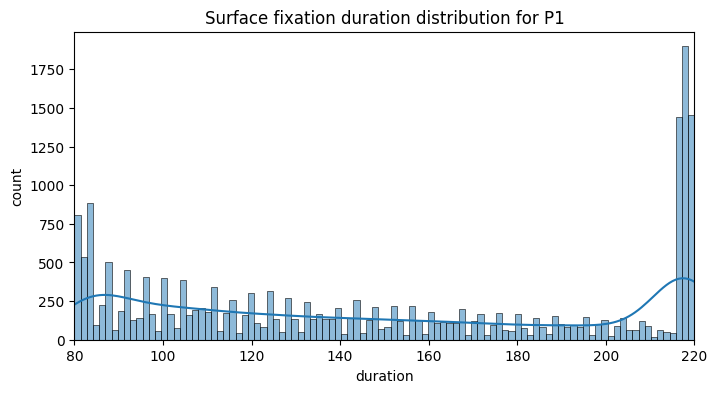

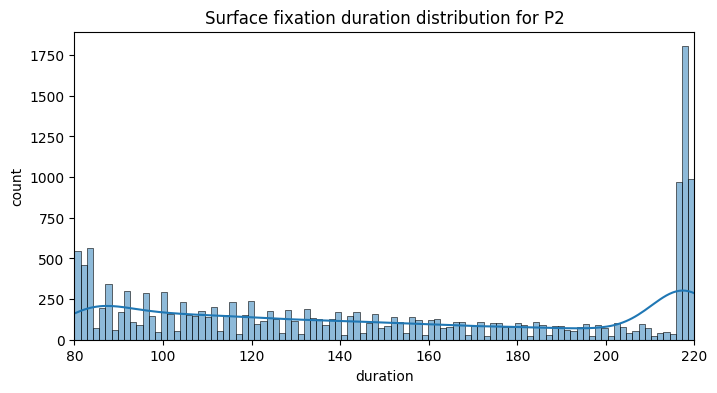

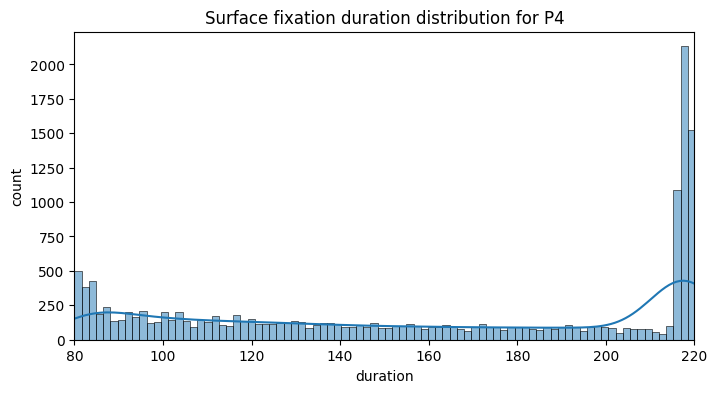

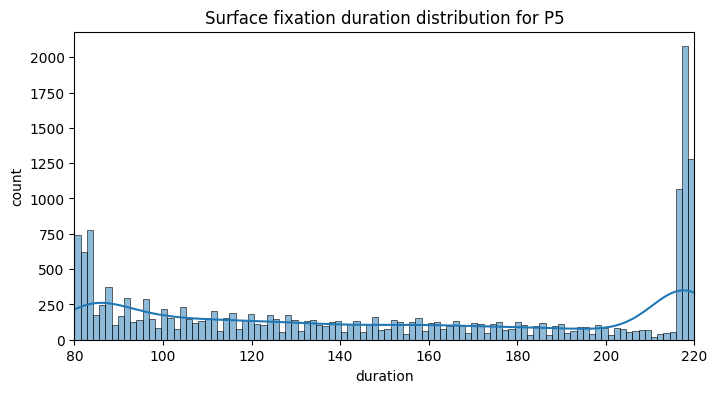

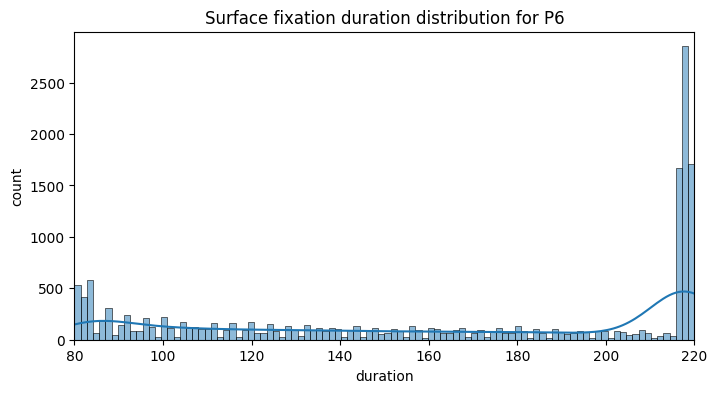

...

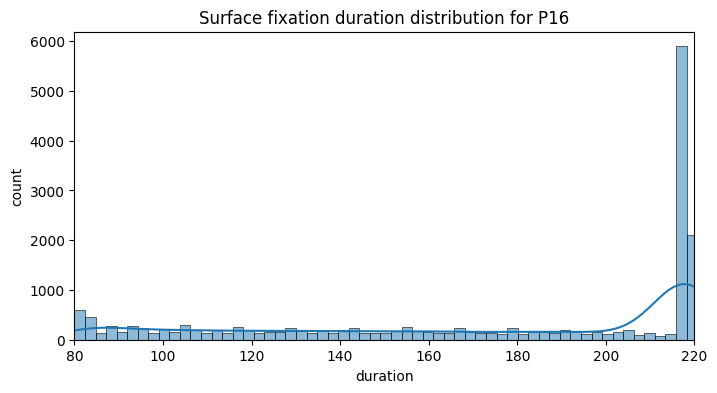

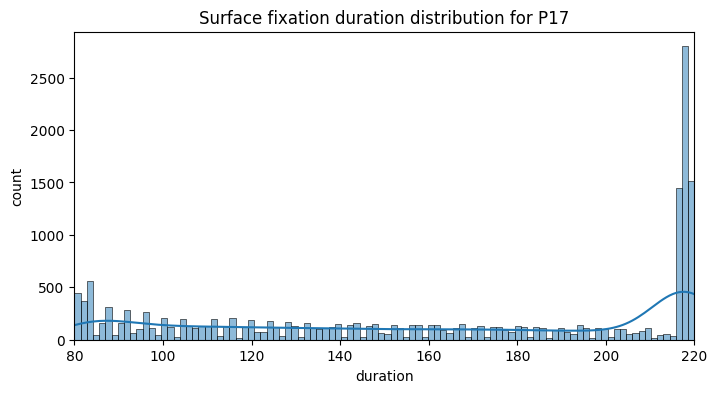

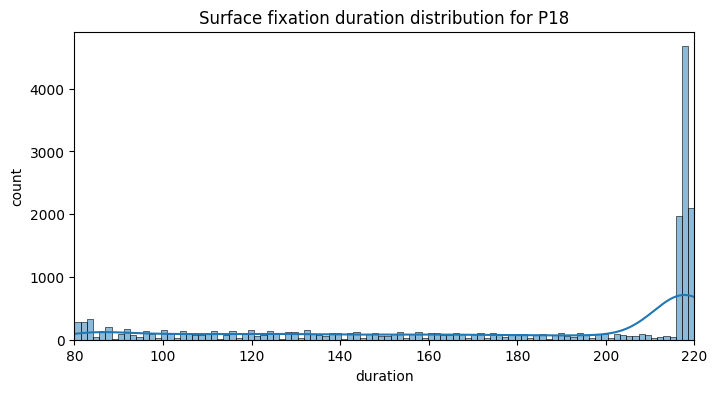

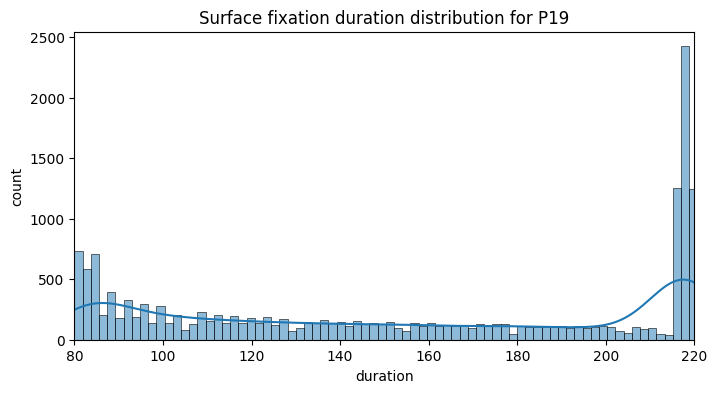

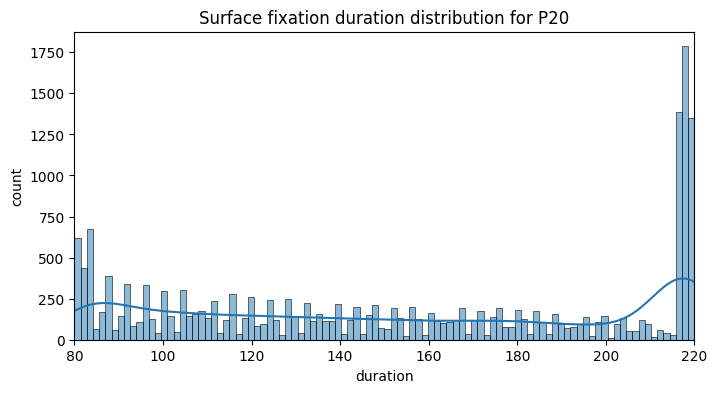

In [57]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['duration'], bins=100, kde=True)
    plt.title(f'Surface fixation duration distribution for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('count')
    plt.xlim(80, 220)
    plt.show()

##### Dispersion distribution
- Higher concentration closer to the upper bound (1.5)

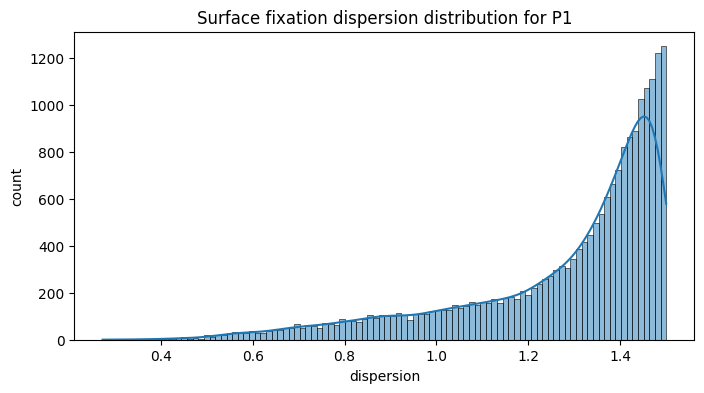

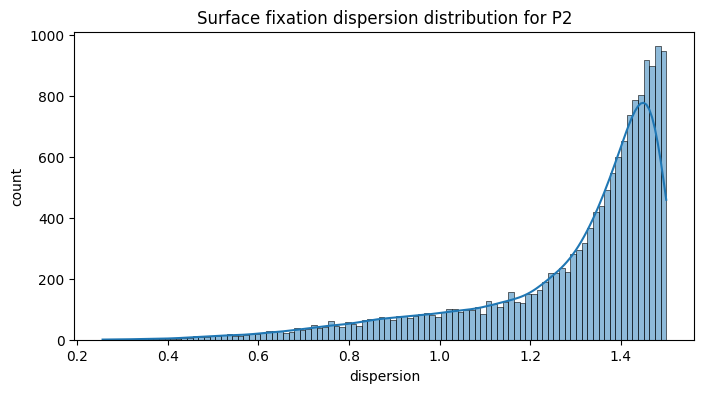

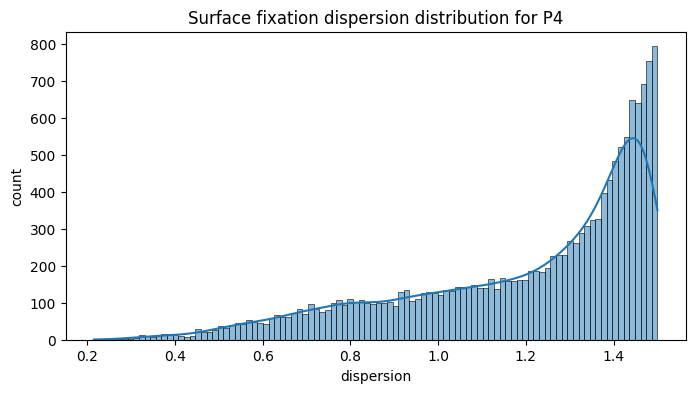

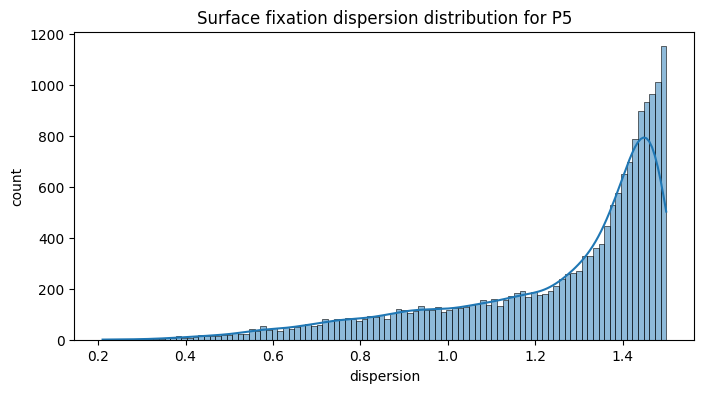

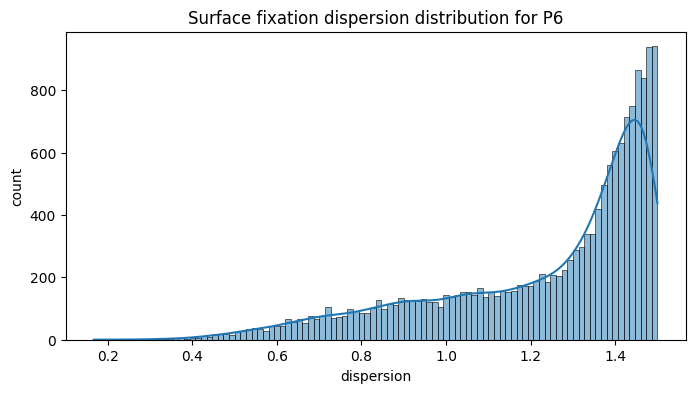

...

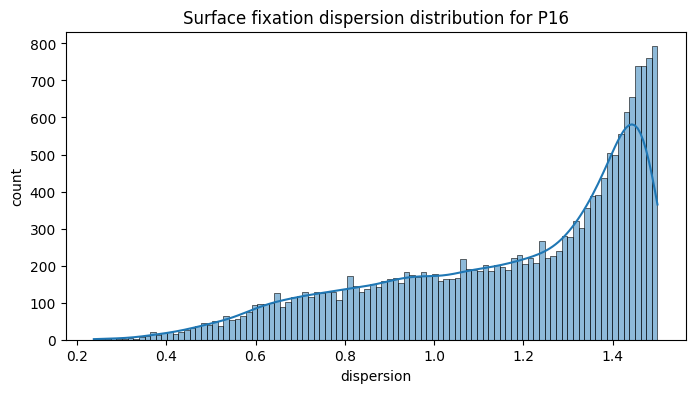

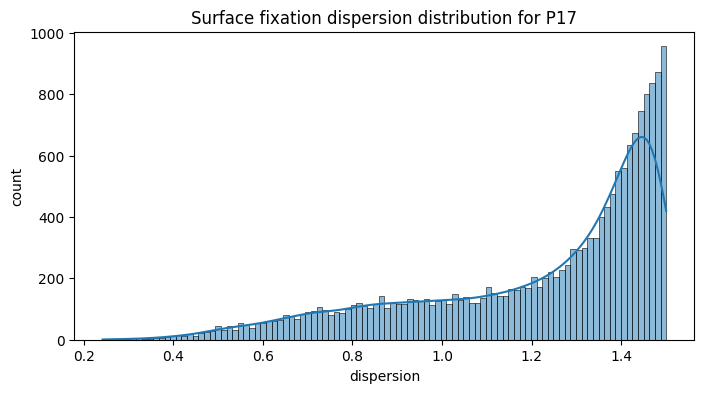

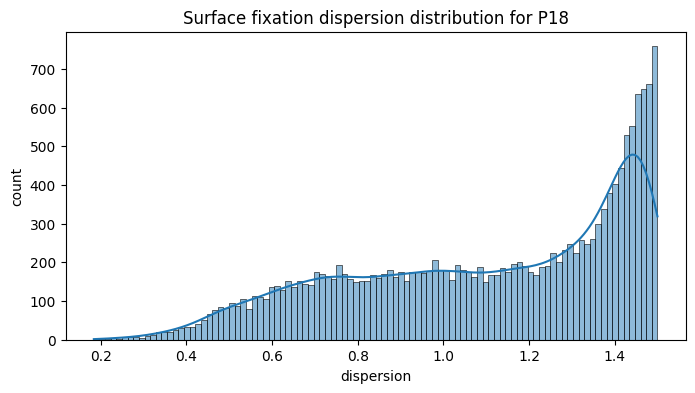

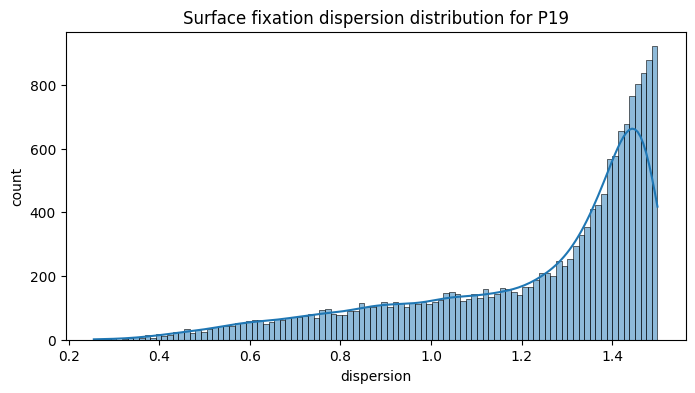

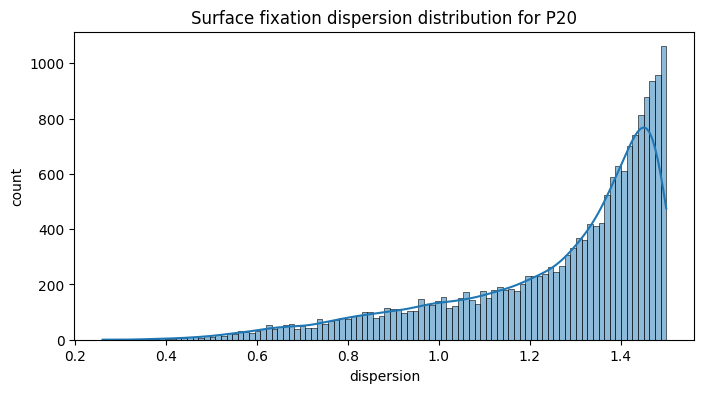

In [58]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['dispersion'], bins=100, kde=True)
    plt.title(f'Surface fixation dispersion distribution for P{pid}')
    plt.xlabel('dispersion')
    plt.ylabel('count')
    # plt.xlim(0,1)
    plt.show()

##### Normalized position distribution
- Outliers

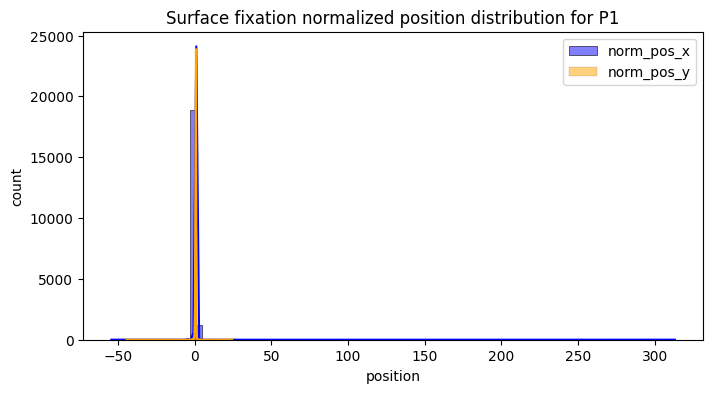

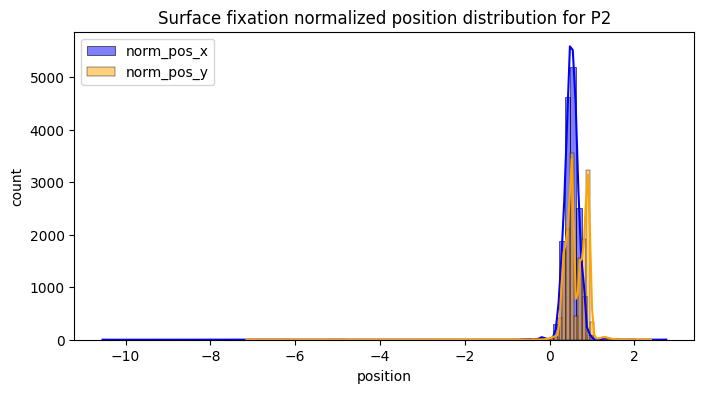

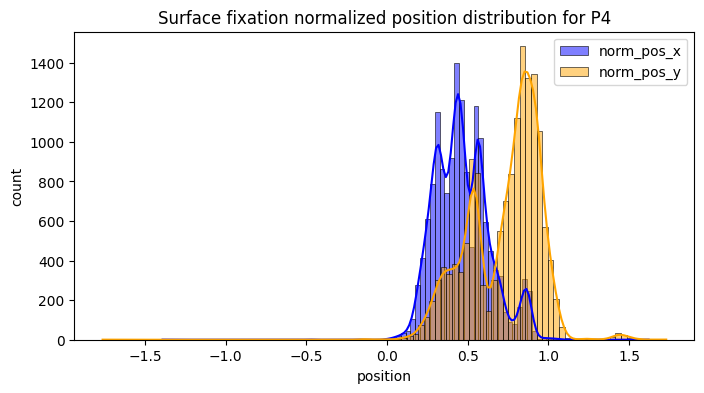

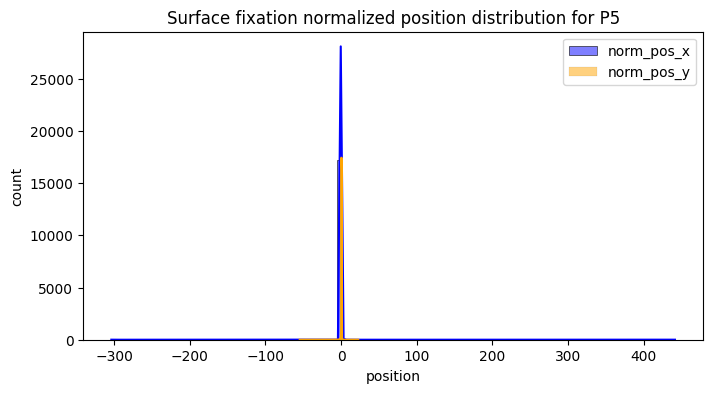

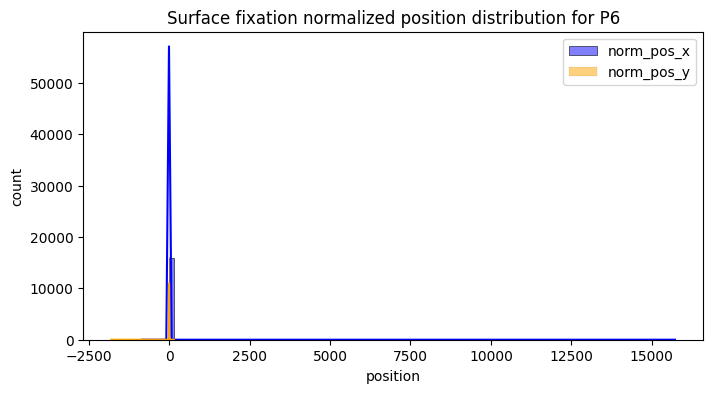

...

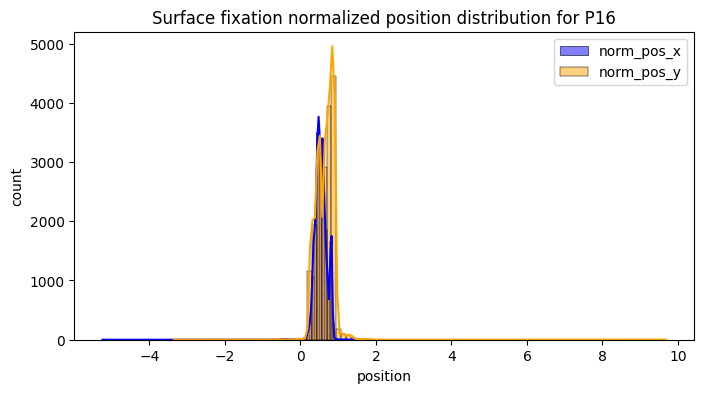

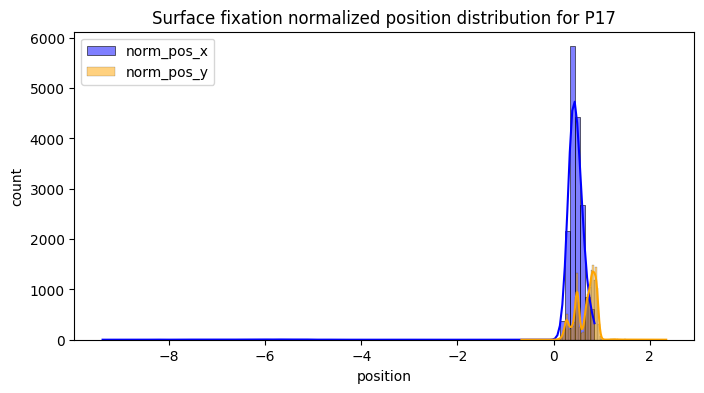

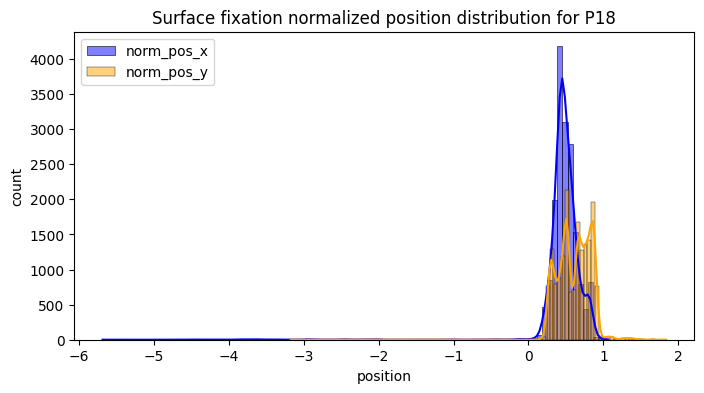

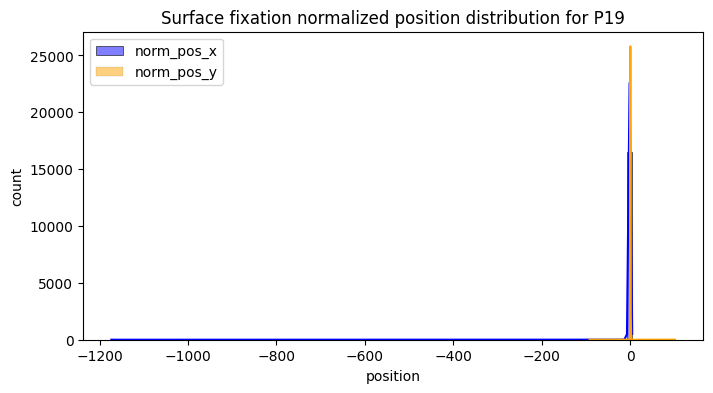

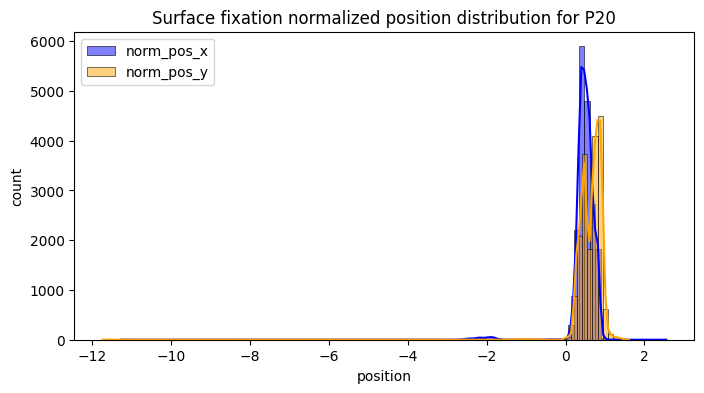

In [59]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_ddf['norm_pos_x'], bins=100, kde=True, color='blue', label='norm_pos_x')
    sns.histplot(participant_ddf['norm_pos_y'], bins=100, kde=True, color='orange', label='norm_pos_y')
    plt.title(f'Surface fixation normalized position distribution for P{pid}')
    plt.xlabel('position')
    plt.ylabel('count')
    plt.legend()
    plt.show()

##### Duration-dispersion correlation
- Higher duration tend to have higher dispersion (except if >214ms)

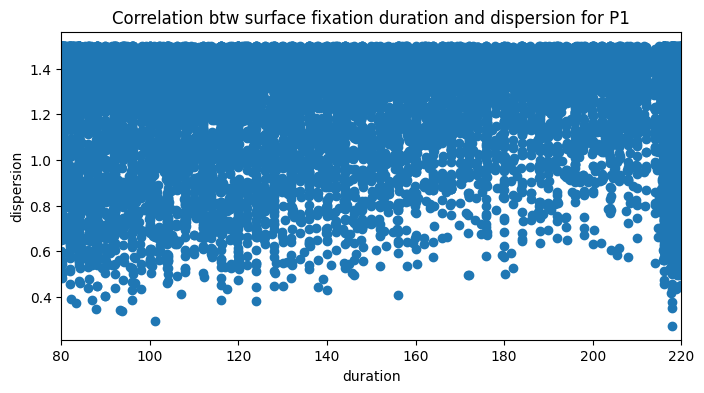

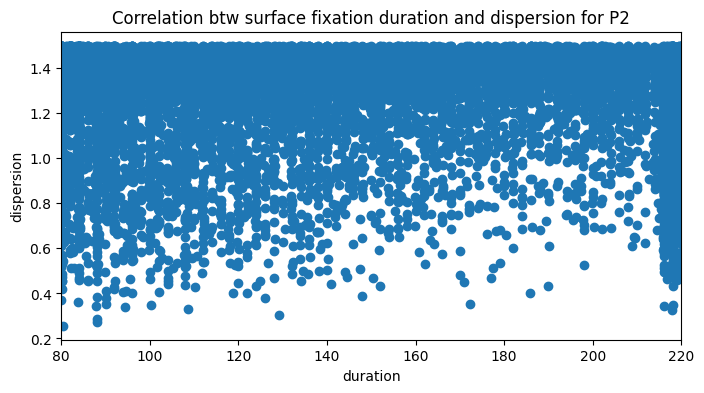

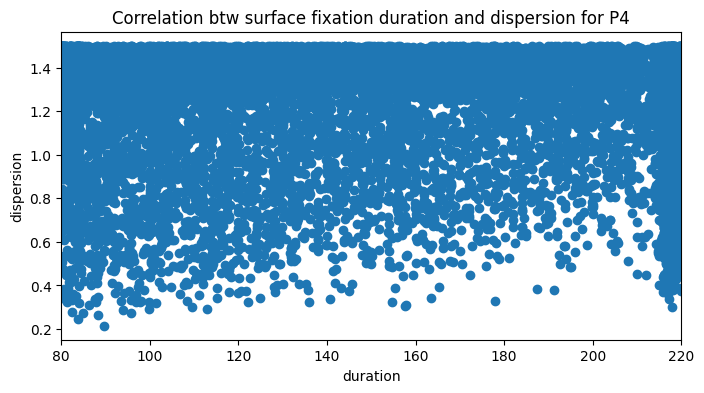

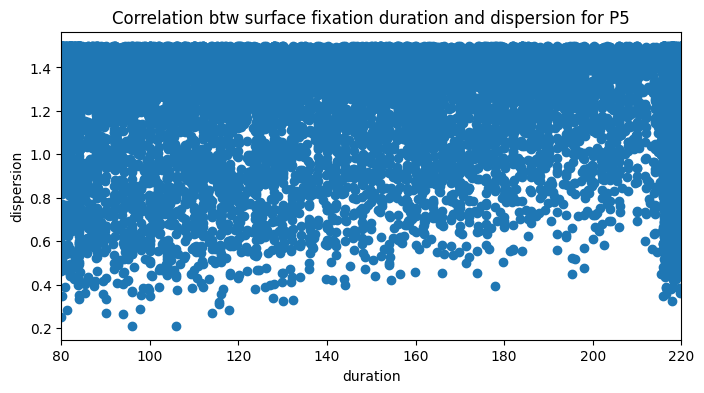

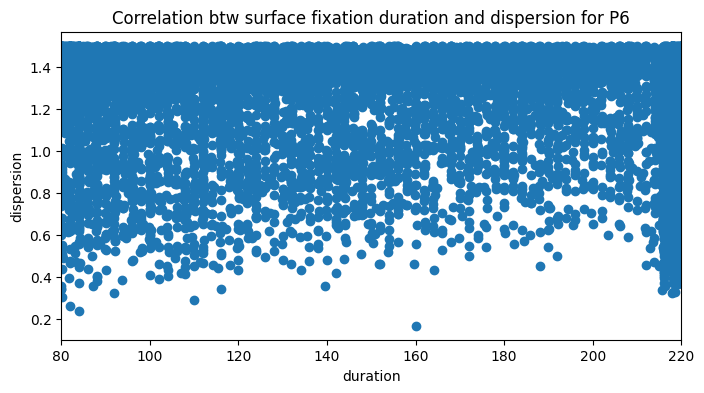

...

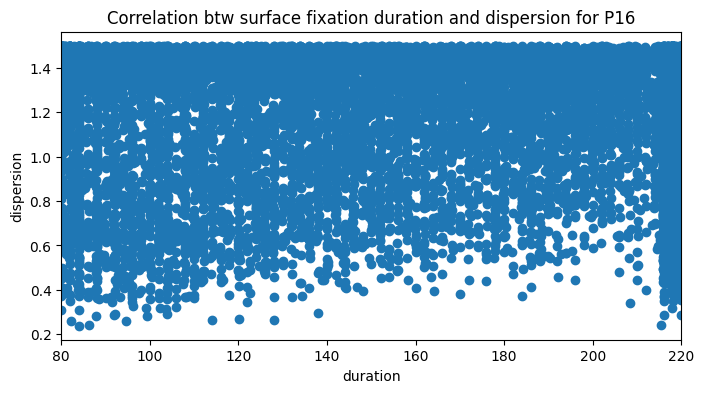

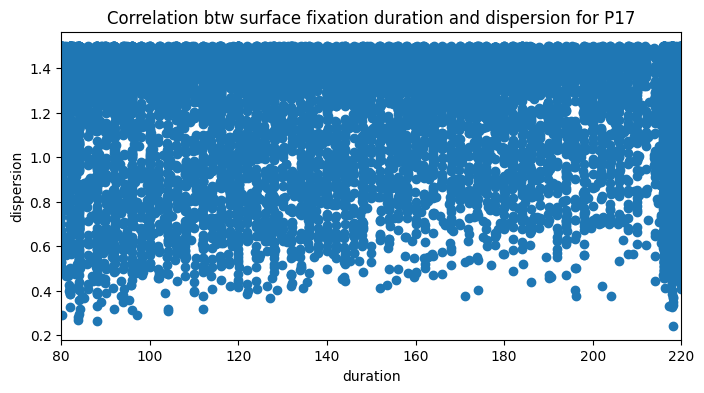

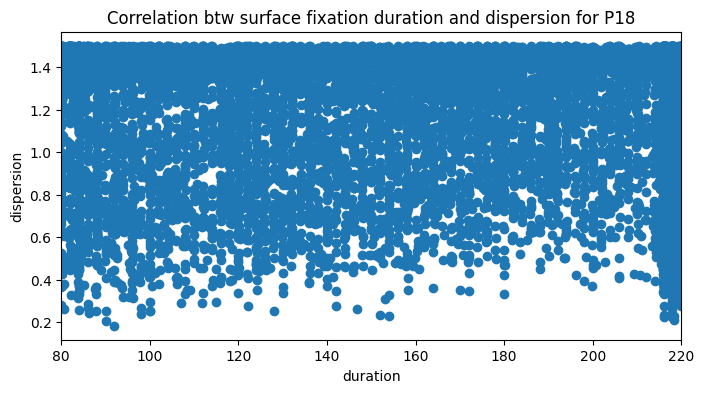

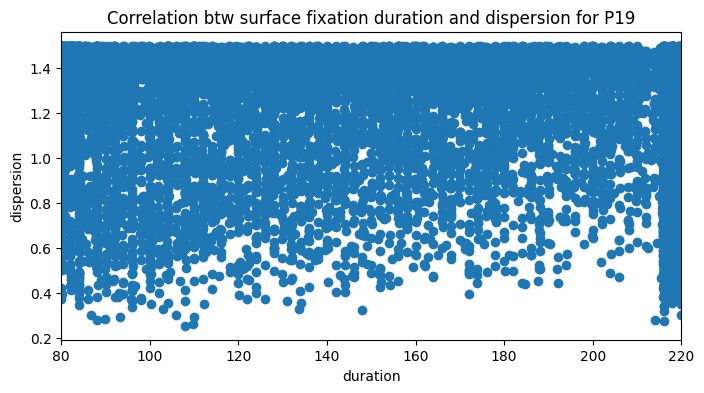

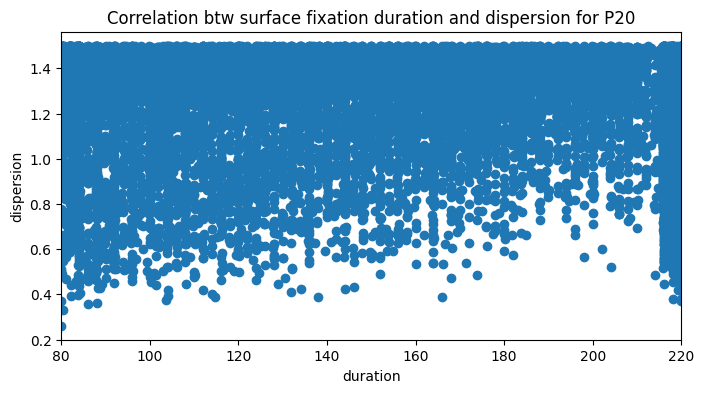

In [60]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['duration'], participant_ddf['dispersion'])
    plt.title(f'Correlation btw surface fixation duration and dispersion for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('dispersion')
    plt.xlim(80,220)
    plt.show()

##### Duration-normalized position correlation
- No correlation

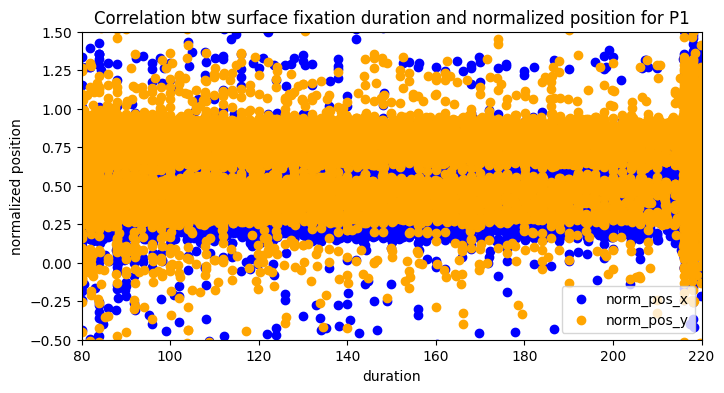

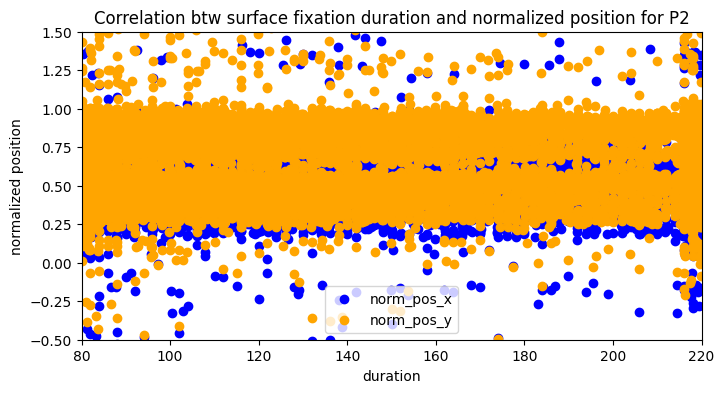

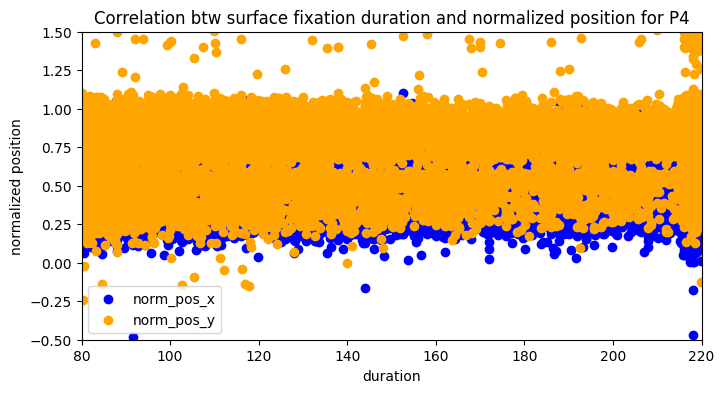

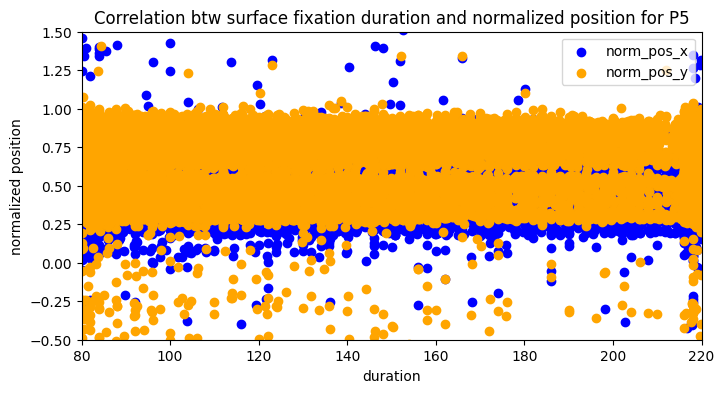

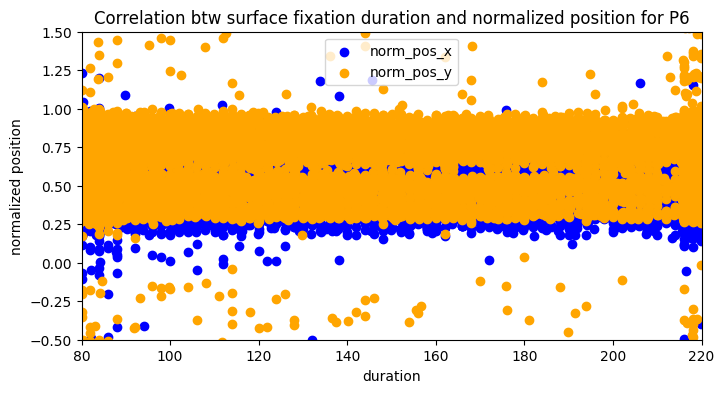

...

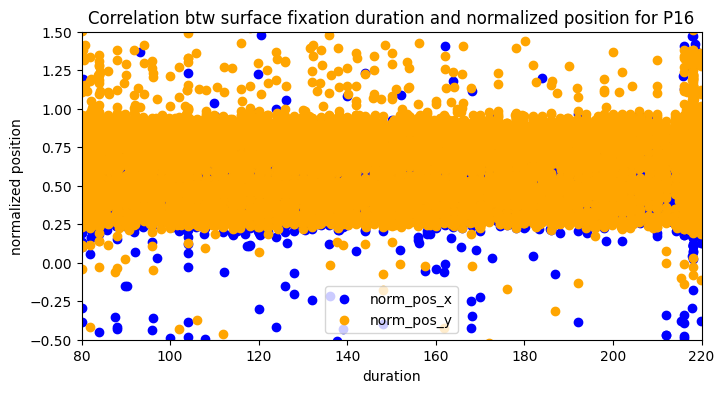

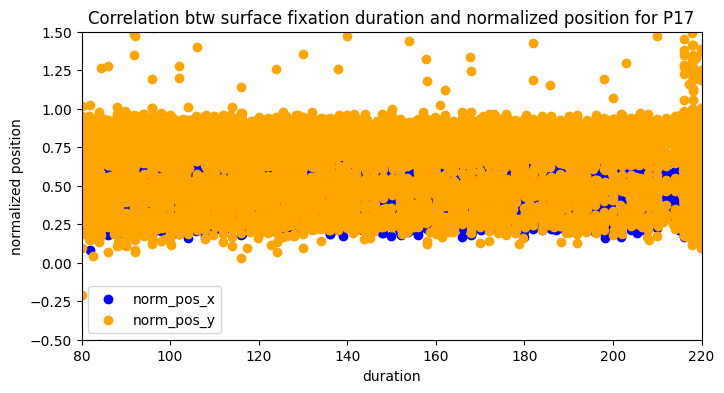

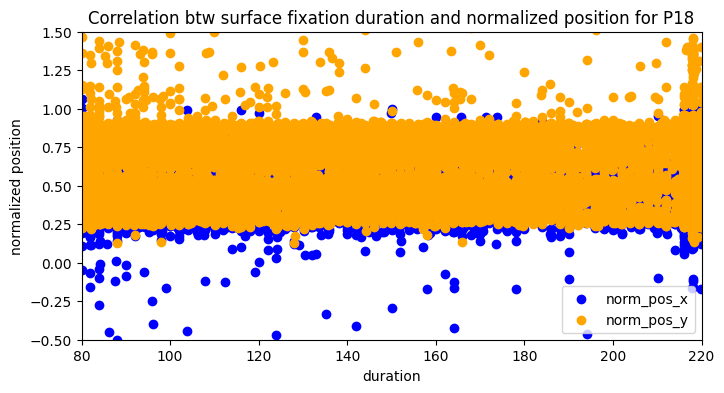

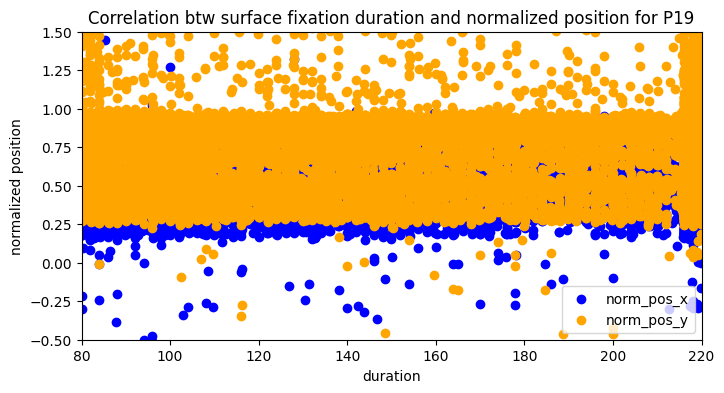

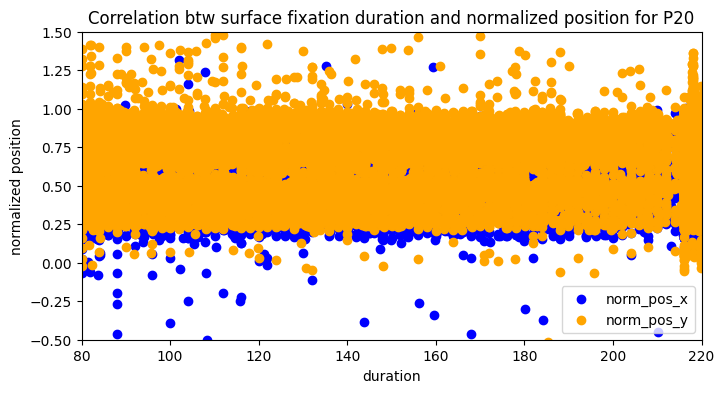

In [61]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['duration'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['duration'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw surface fixation duration and normalized position for P{pid}')
    plt.xlabel('duration')
    plt.ylabel('normalized position')
    plt.xlim(80, 220)
    plt.ylim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Dispersion-normalized position correlation
- No correlation

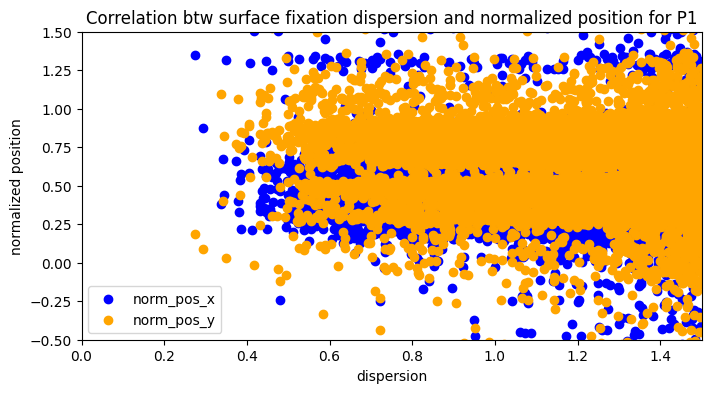

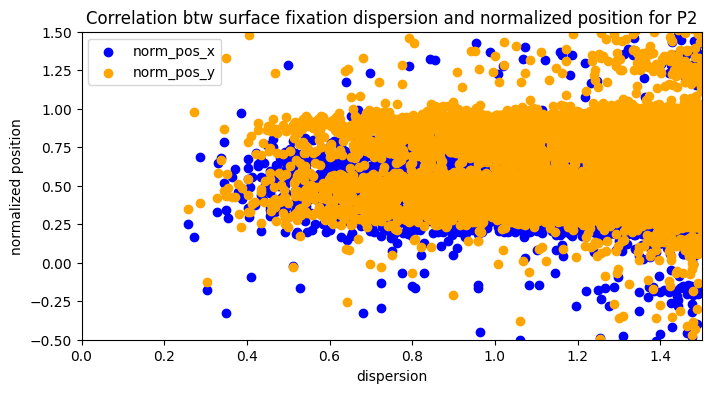

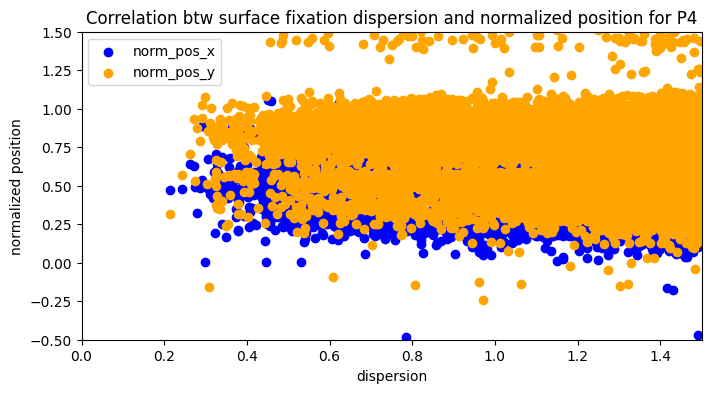

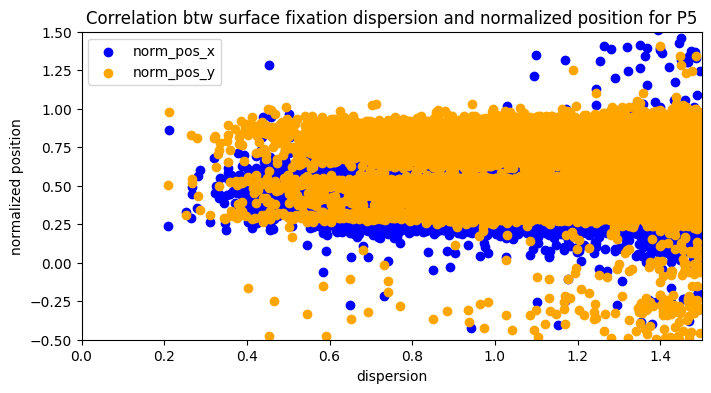

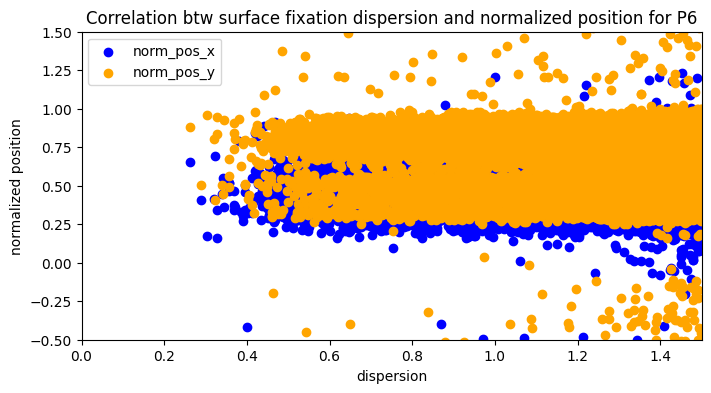

...

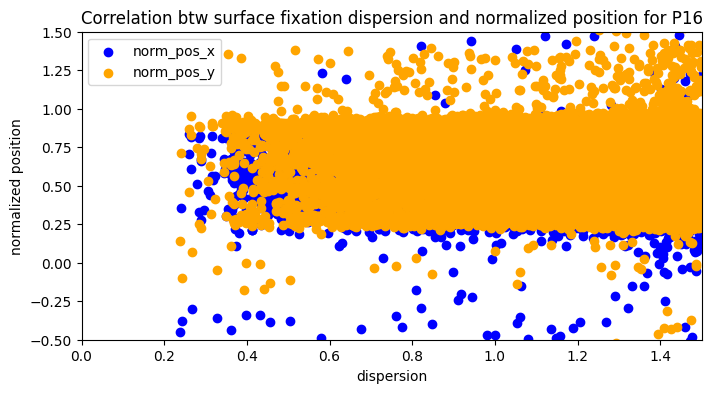

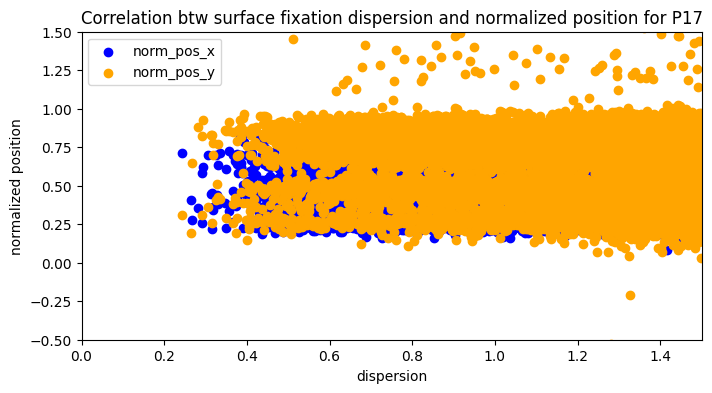

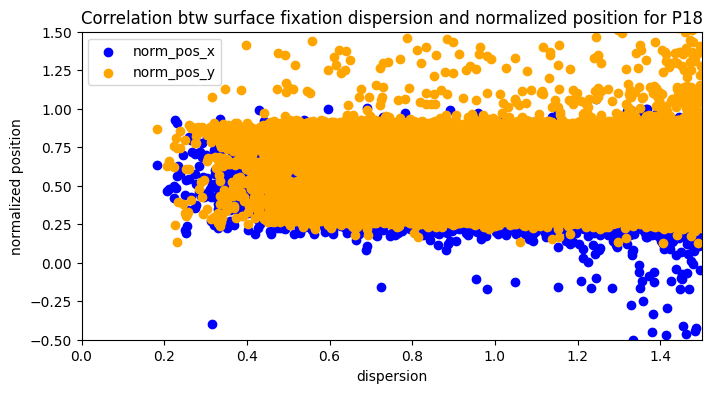

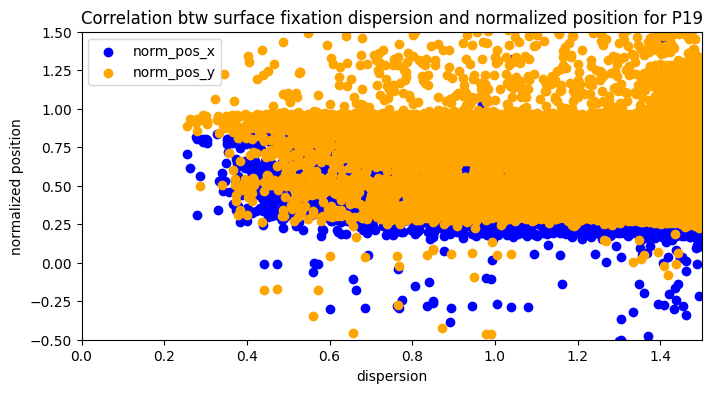

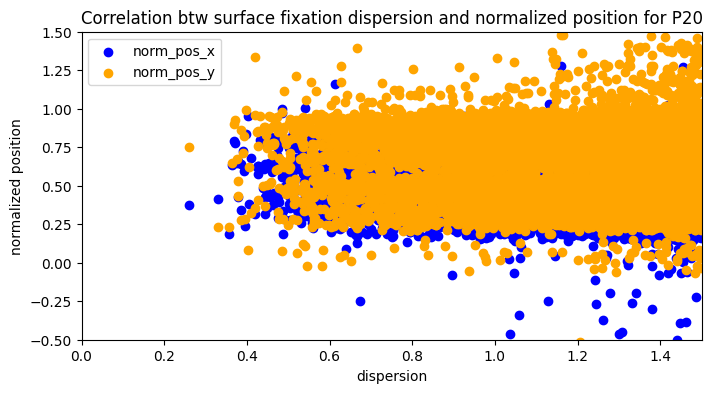

In [62]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_ddf['dispersion'], participant_ddf['norm_pos_x'], color='blue', label='norm_pos_x')
    plt.scatter(participant_ddf['dispersion'], participant_ddf['norm_pos_y'], color='orange', label='norm_pos_y')
    plt.title(f'Correlation btw surface fixation dispersion and normalized position for P{pid}')
    plt.xlabel('dispersion')
    plt.ylabel('normalized position')
    plt.xlim(0, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.legend()
    plt.show()

##### Duration boxplot
- Good

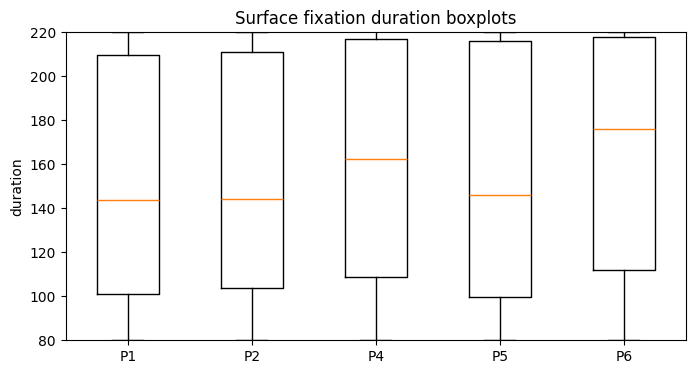

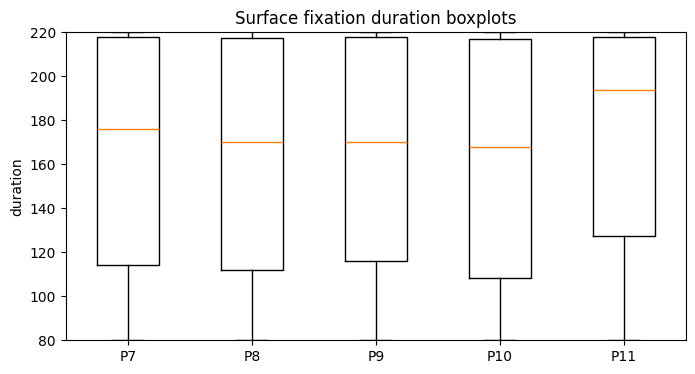

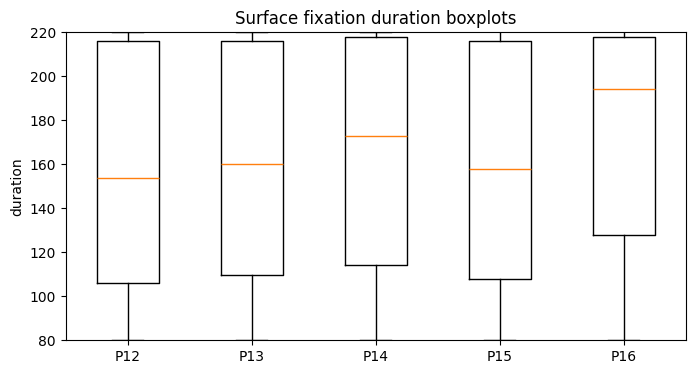

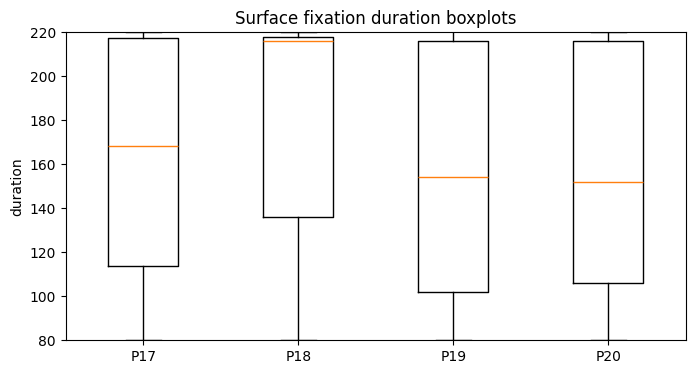

In [63]:
grouped_ids = [participant_ids[i:i+5] for i in range(0, len(participant_ids), 5)] #group ids
for group in grouped_ids: #iterate groups
    participants_ddf = [ddf[ddf['participant_id'] == pid]['duration'] for pid in group] #get group's sub-ddfs
    plt.figure(figsize=(8, 4))
    plt.boxplot(participants_ddf, whis = 1.5)
    plt.title(f'Surface fixation duration boxplots')
    plt.ylabel('duration')
    plt.ylim(80, 220)
    plt.xticks(range(1, len(group) + 1), [f'P{pid}' for pid in group]) #single boxplots labels
    plt.show()

##### Dispersion boxplot
- Lower whiskers are NOT outliers

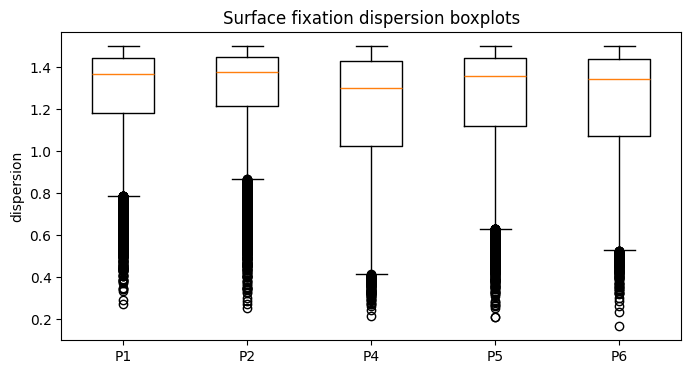

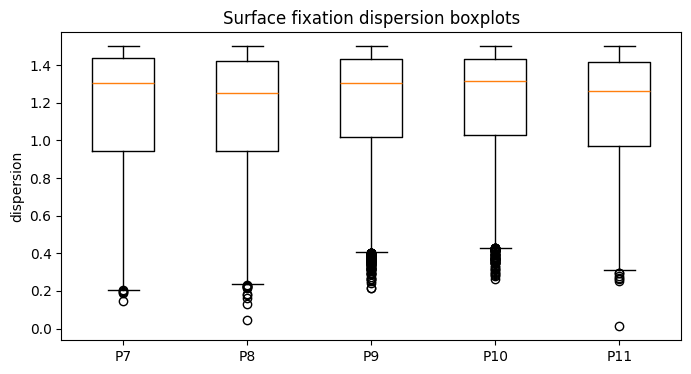

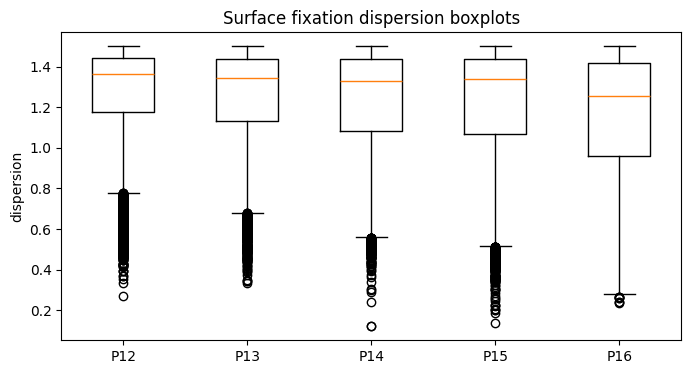

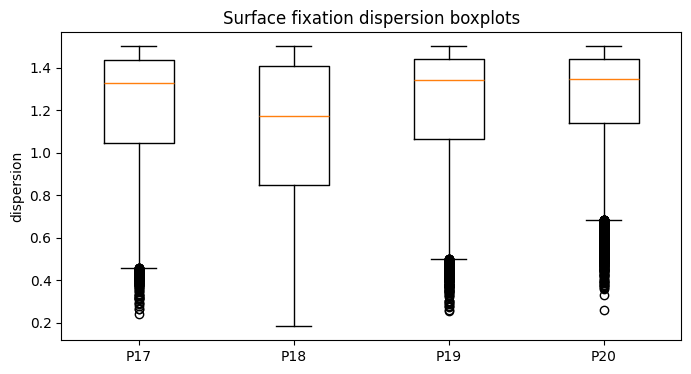

In [64]:
grouped_ids = [participant_ids[i:i+5] for i in range(0, len(participant_ids), 5)] #group ids
for group in grouped_ids: #iterate groups
    participants_ddf = [ddf[ddf['participant_id'] == pid]['dispersion'] for pid in group] #get group's sub-ddfs
    plt.figure(figsize=(8, 4))
    plt.boxplot(participants_ddf, whis = 1.5)
    plt.title(f'Surface fixation dispersion boxplots')
    plt.ylabel('dispersion')
    # plt.ylim(0, 1.5)
    plt.xticks(range(1, len(group) + 1), [f'P{pid}' for pid in group]) #single boxplots labels
    plt.show()

##### Normalized position boxplot
- Close whiskers are not outliers

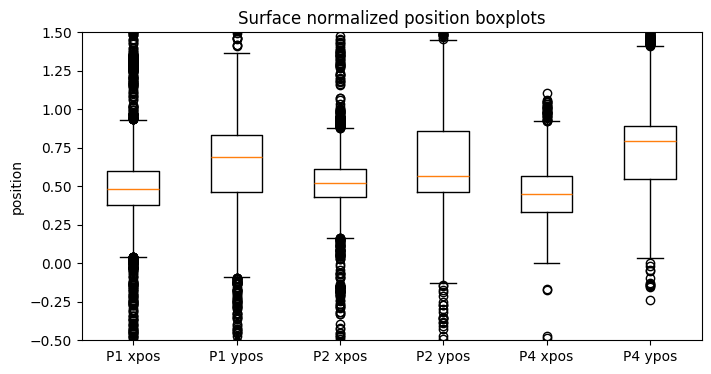

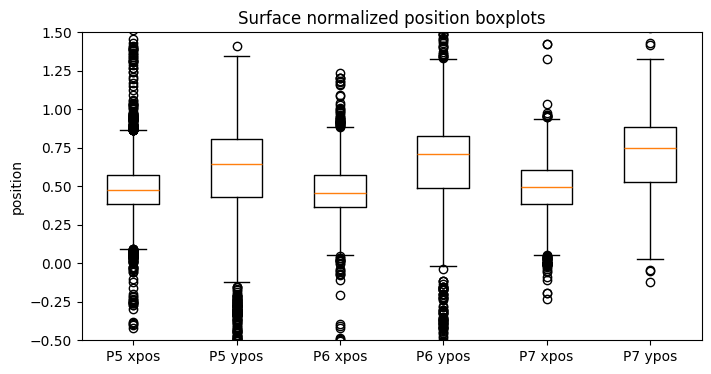

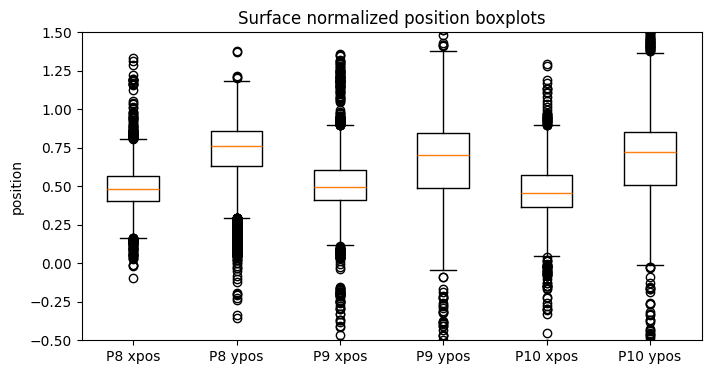

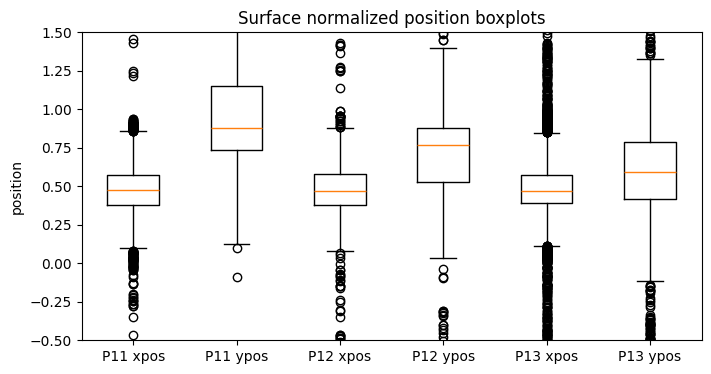

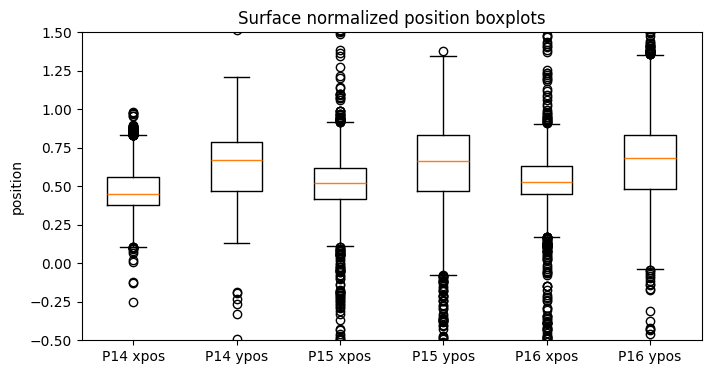

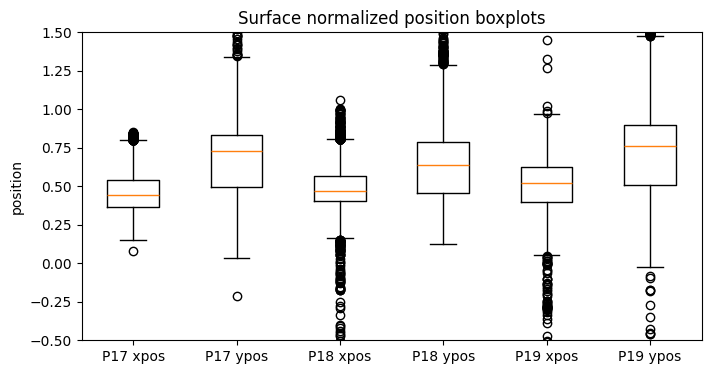

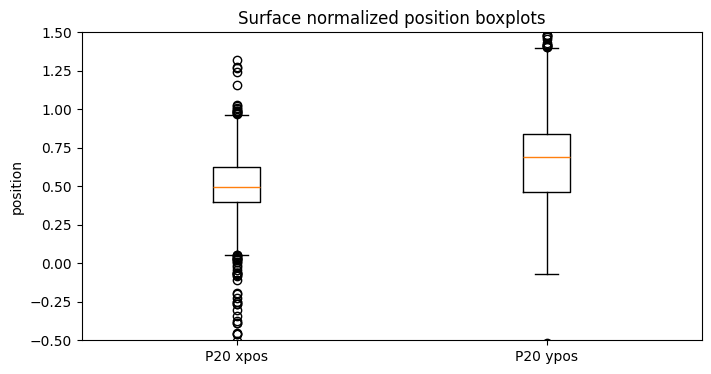

In [65]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    pos_ddf = []
    labels = []
    for pid in group:
        participant_ddf = ddf[ddf['participant_id'] == pid]
        x = participant_ddf['norm_pos_x']
        y = participant_ddf['norm_pos_y']
        pos_ddf.append(x)
        pos_ddf.append(y)
        labels.append(f'P{pid} xpos')
        labels.append(f'P{pid} ypos')
    plt.figure(figsize=(8, 4))
    plt.boxplot(pos_ddf, whis = 1.5)
    plt.title(f'Surface normalized position boxplots')
    plt.ylabel('position')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(-0.5, 1.5)
    plt.show()

##### Spatial distribution with surface
- Many relatable pattern of fixations (wider on top side of the surface)
- P11 has lot of fixations right above the surface (glasses adjustment?)
- p17 barely look off-surface

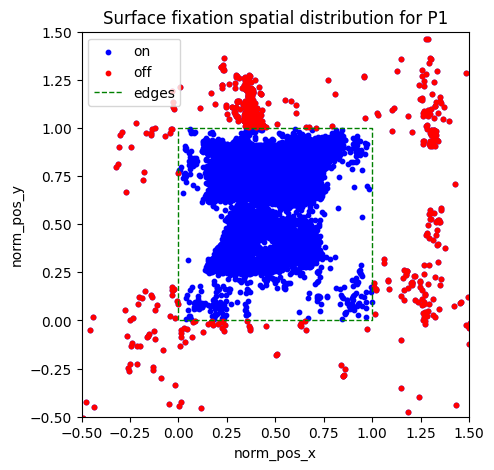

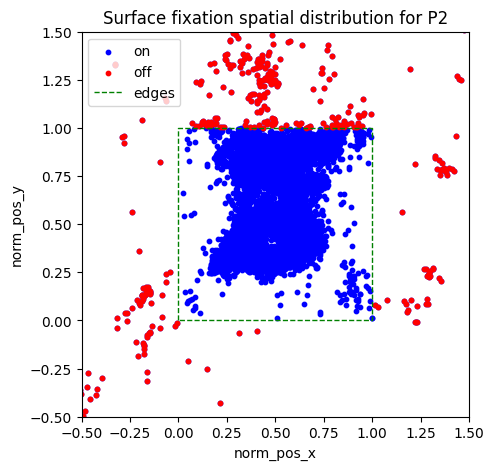

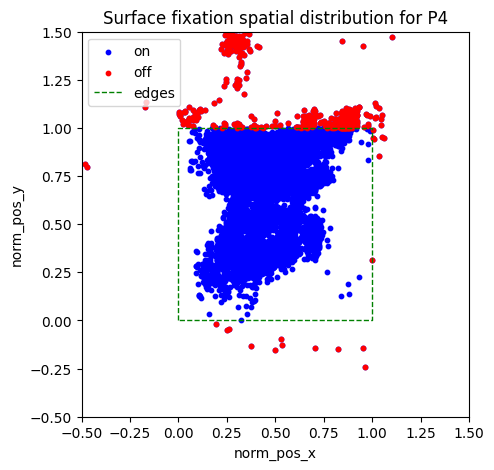

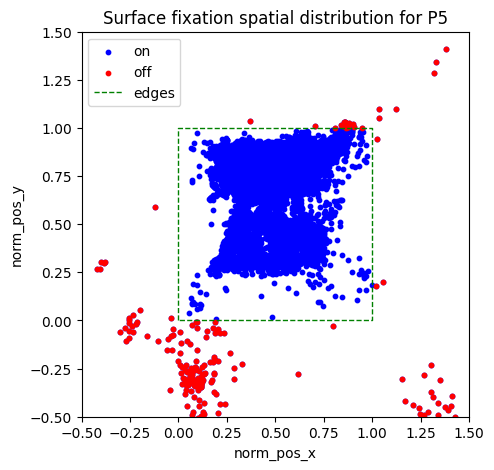

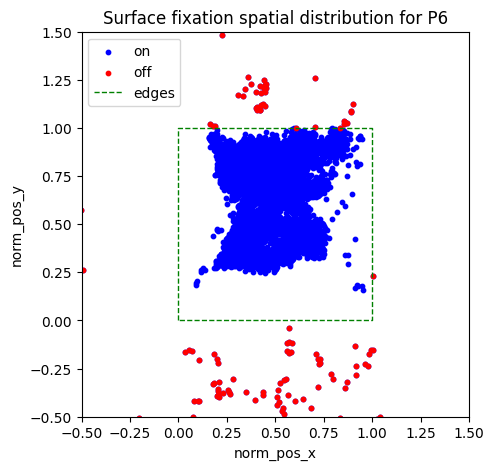

...

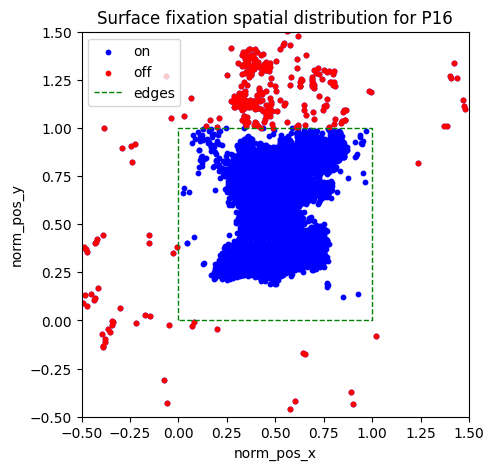

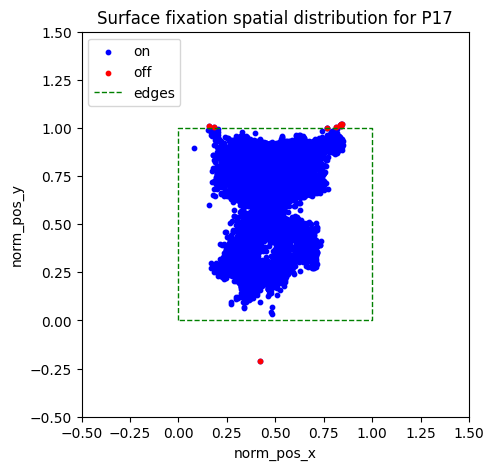

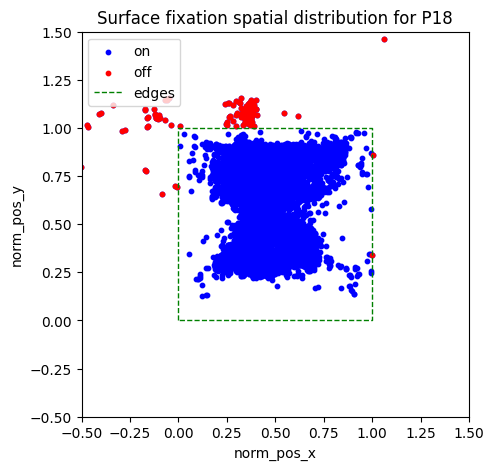

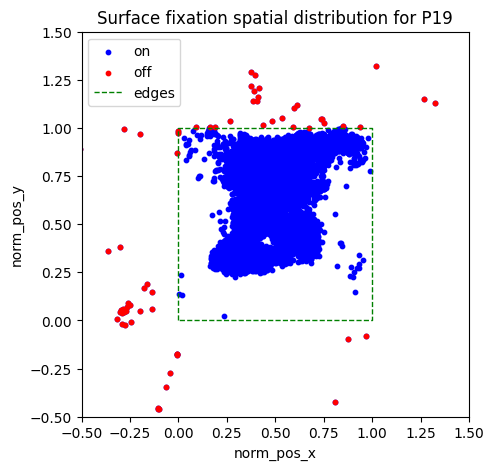

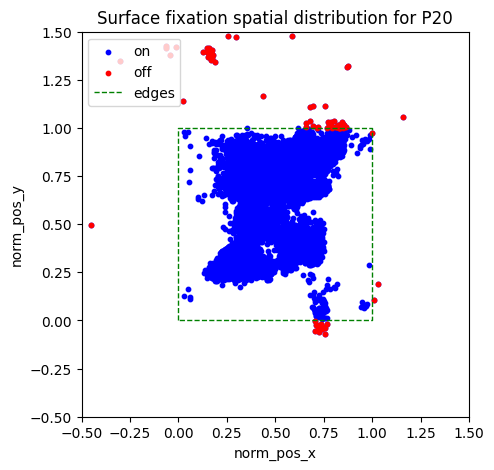

In [75]:
df['relative_timestamp'] = df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    on_surface = participant_df[participant_df['on_surf'] == False]
    plt.figure(figsize=(5, 5))
    plt.scatter(participant_df['norm_pos_x'], participant_df['norm_pos_y'], s=10, color='blue', label='on')
    plt.scatter(on_surface['norm_pos_x'], on_surface['norm_pos_y'], s=10, color='red', label='off')

    # Draw closed rectangle
    rectangle_x = [0, 0, 1, 1, 0]
    rectangle_y = [0, 1, 1, 0, 0]
    plt.plot(rectangle_x, rectangle_y, color='green', linestyle='--', linewidth=1, label='edges')

    plt.title(f'Surface fixation spatial distribution for P{pid}')
    plt.xlabel('norm_pos_x')
    plt.ylabel('norm_pos_y')
    plt.xlim(-0.5, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.legend(loc='upper left')
    plt.show()

##### Heatmap
- Tendency to look in the middle
- Tendency (smaller) to loon on the top centtral area of the screen (warnings/questionnaires)

In [77]:
# Heatmap df (clamping according to plot axes limits)
heatmap_df = df[(df['norm_pos_x'] >= -.5) & (df['norm_pos_x'] <= 1.5) & (df['norm_pos_y'] >= -.5) & (df['norm_pos_y'] <= 1.5)]

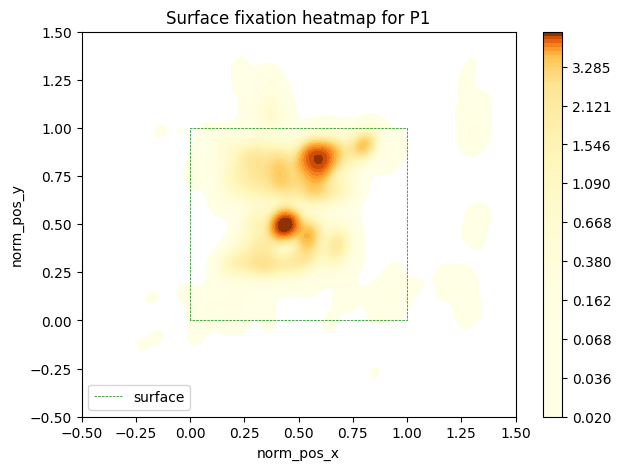

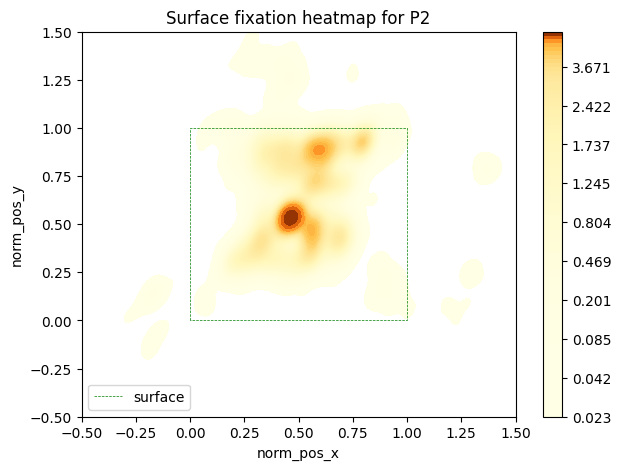

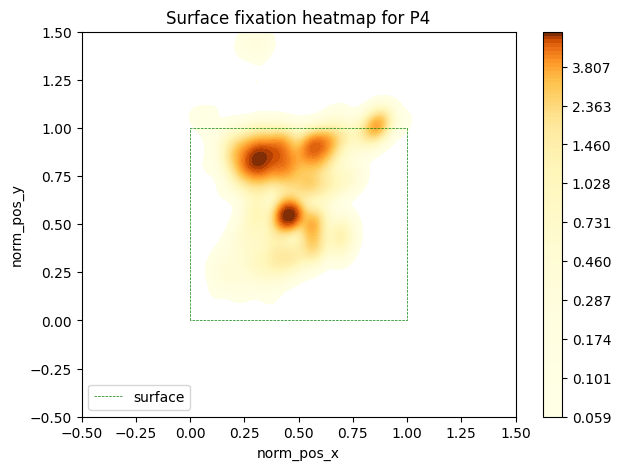

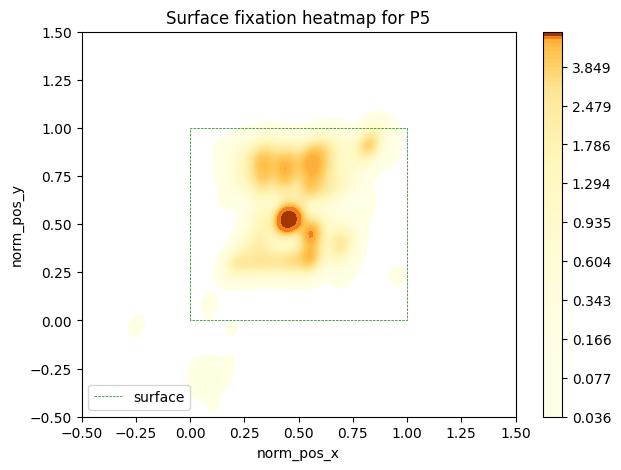

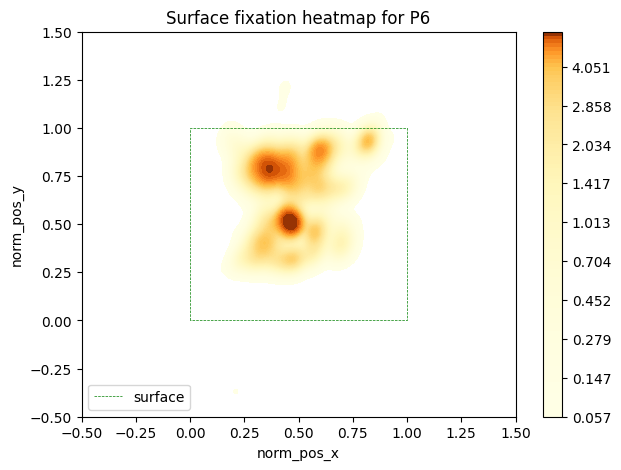

...

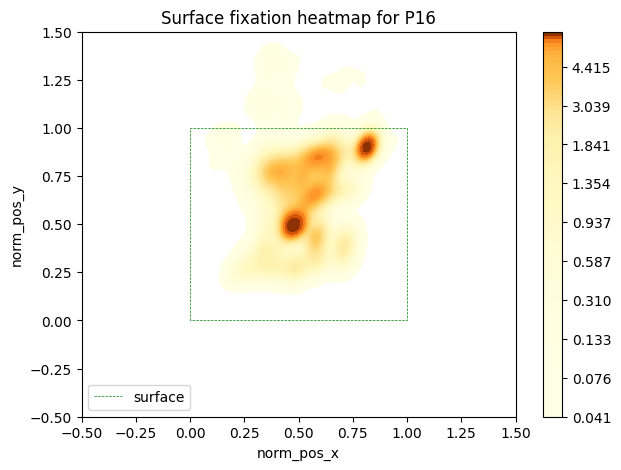

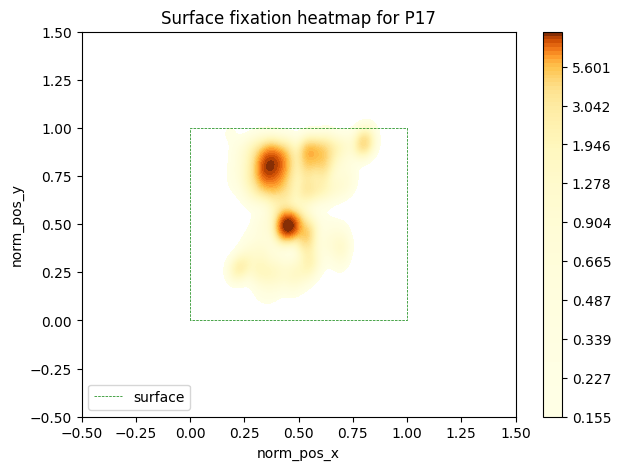

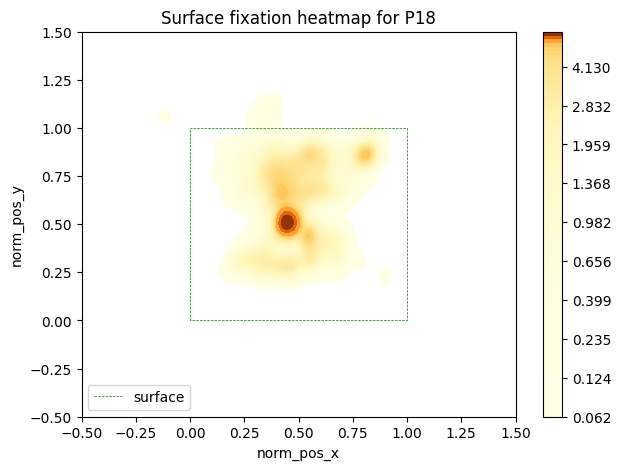

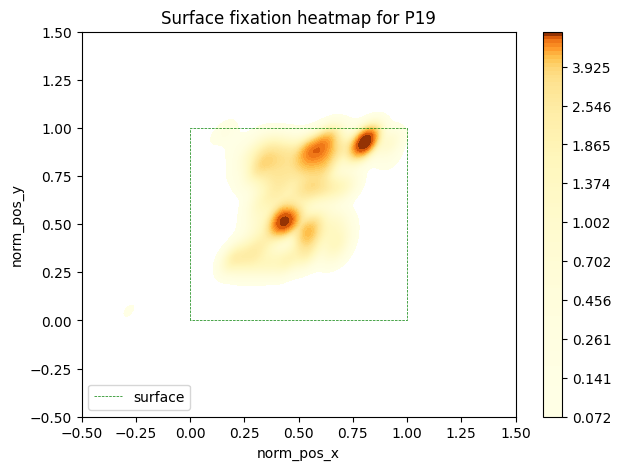

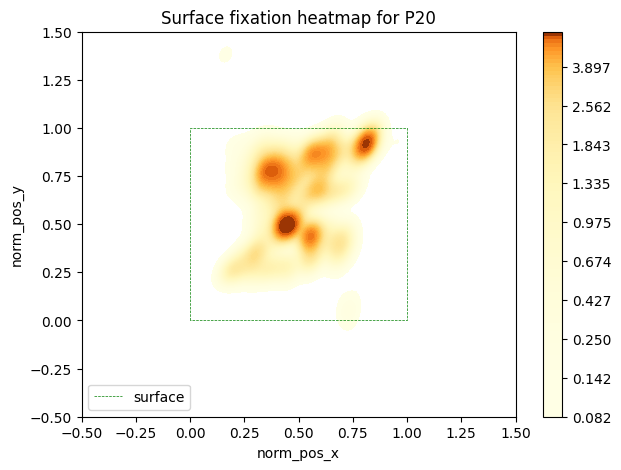

In [78]:
for pid in participant_ids:
    participant_df = heatmap_df[heatmap_df['participant_id'] == pid]

    plt.figure(figsize=(7, 5))

    # Creating the heatmap
    sns.kdeplot(
        x=participant_df['norm_pos_x'], 
        y=participant_df['norm_pos_y'],
        fill=True, 
        thresh=0,
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=True
    )

    # Draw closed rectangle
    rectangle_x = [0, 0, 1, 1, 0]
    rectangle_y = [0, 1, 1, 0, 0]
    plt.plot(rectangle_x, rectangle_y, color='green', linestyle='--', linewidth=0.5, label='surface')

    plt.title(f'Surface fixation heatmap for P{pid}')
    plt.xlabel('norm_pos_x')
    plt.ylabel('norm_pos_y')
    plt.xlim(-0.5, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.legend(loc='lower left')
    plt.show()

### 3. Time-Series Assessment
Duration, Dispersion, Normalized position, (off-)Occurences

##### Duration over time
- Should be plotted event-related
- Many off-surface occurencies (ex. P11) and after a certain timestamp
- Decrease of duration in P07 in a certain time-span
- No specific off-surface duration

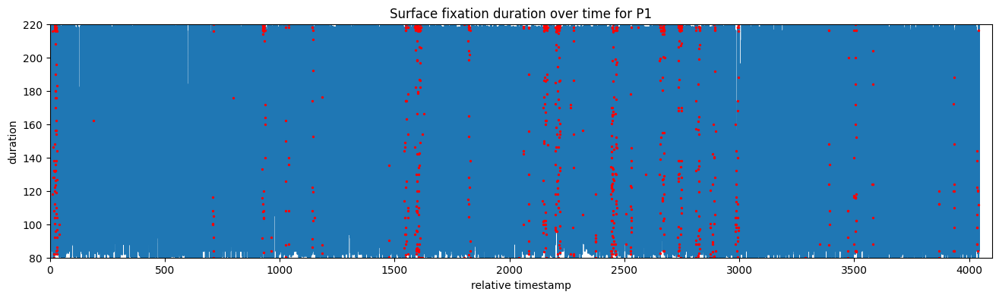

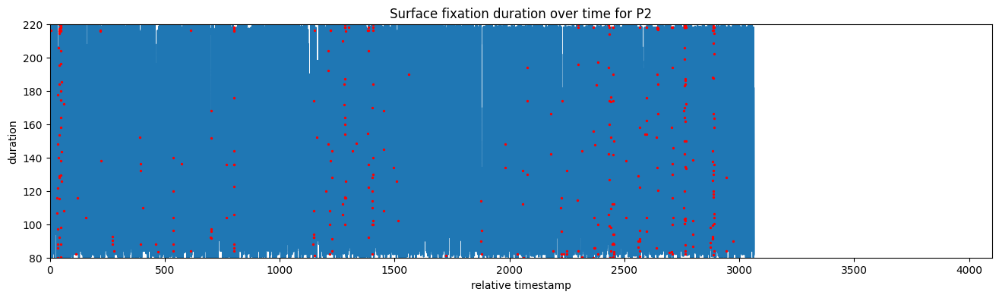

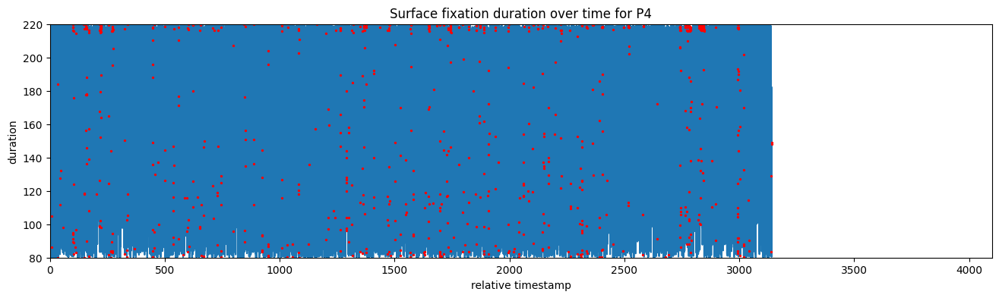

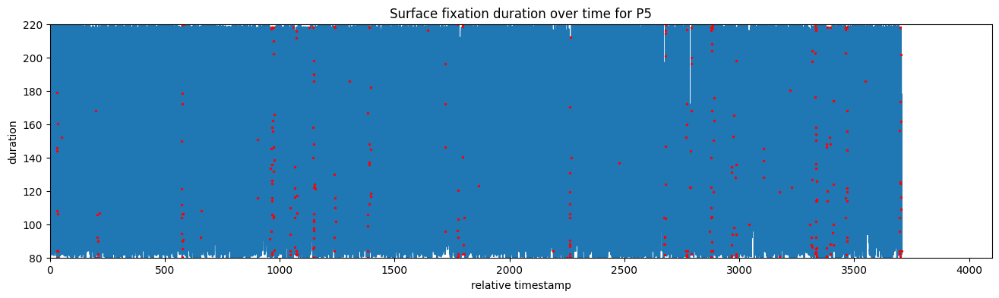

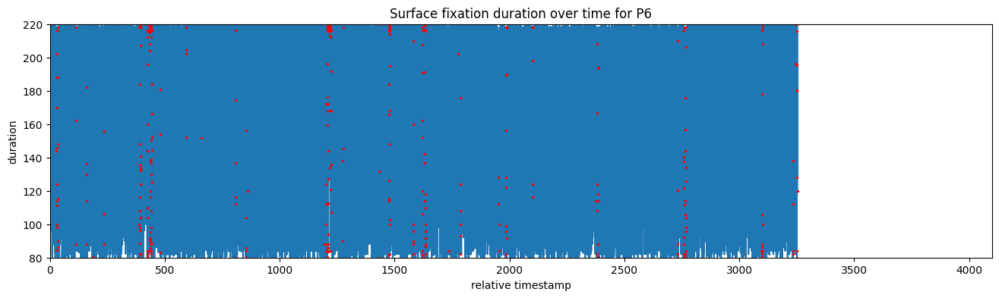

...

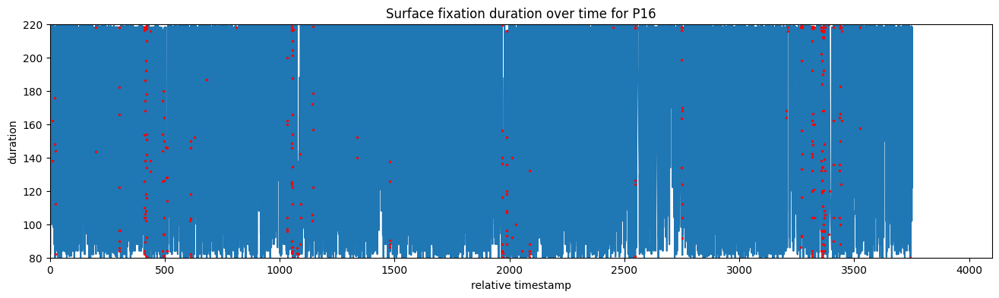

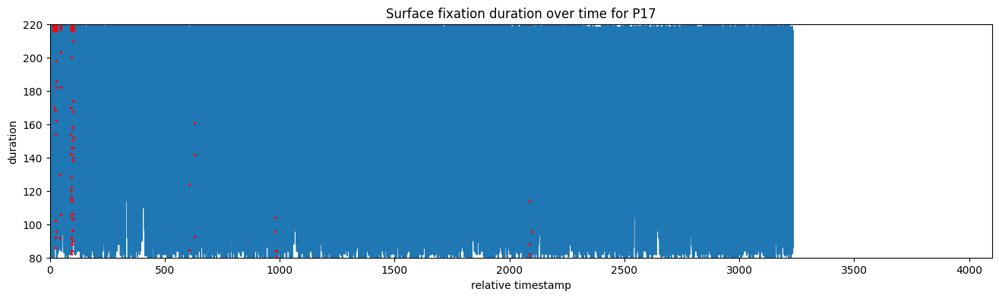

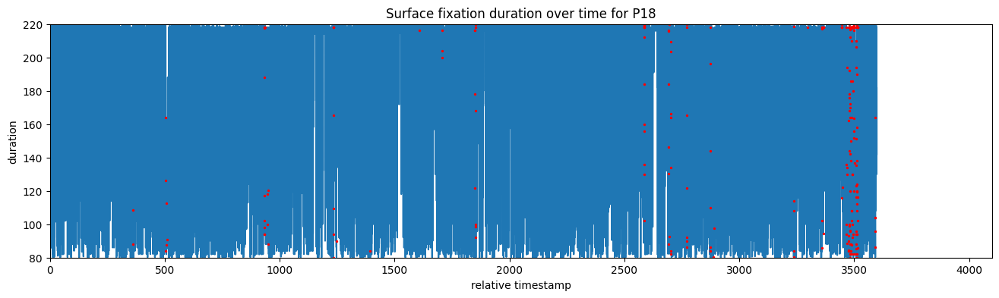

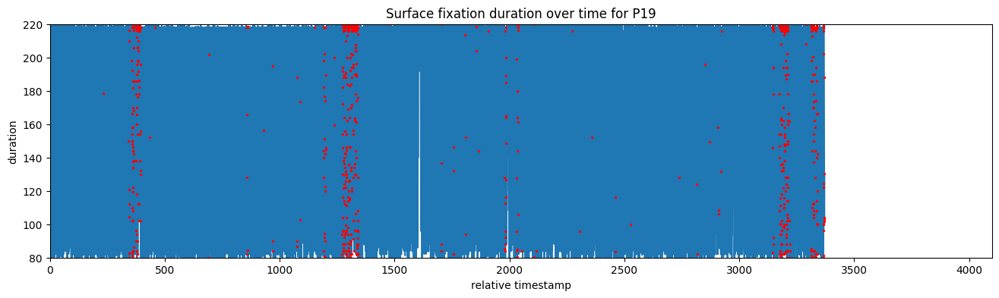

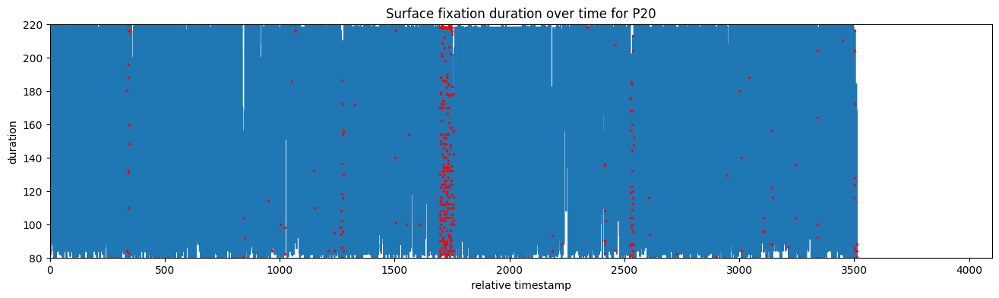

In [69]:
df['relative_timestamp'] = df.groupby('participant_id')['start_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    off_surface = participant_df[participant_df['on_surf'] == False]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['duration'])
    plt.scatter(off_surface['relative_timestamp'], off_surface['duration'], color='red', s=2, label='off_surface', zorder=2)
    plt.title(f'Surface fixation duration over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('duration')
    plt.xlim(0, 4100)
    plt.ylim(80, 220)
    plt.show()

##### Dispersion over time
- Should be plotted event-related
- Many off-surface occurencies (ex. P11)
- No specific off-surface duration

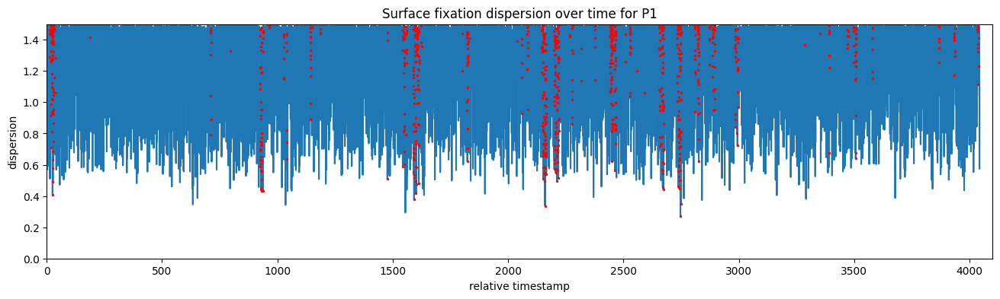

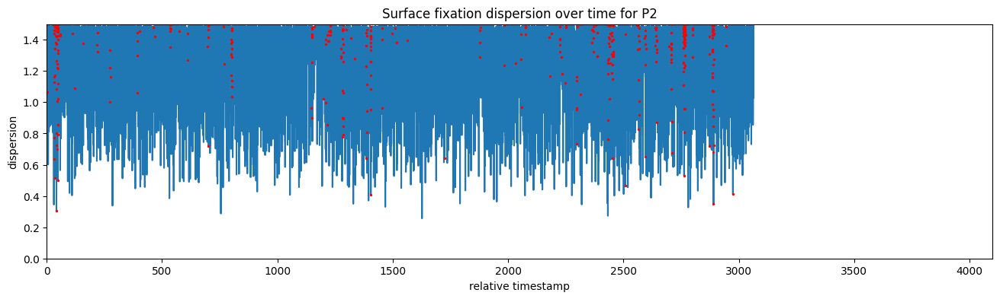

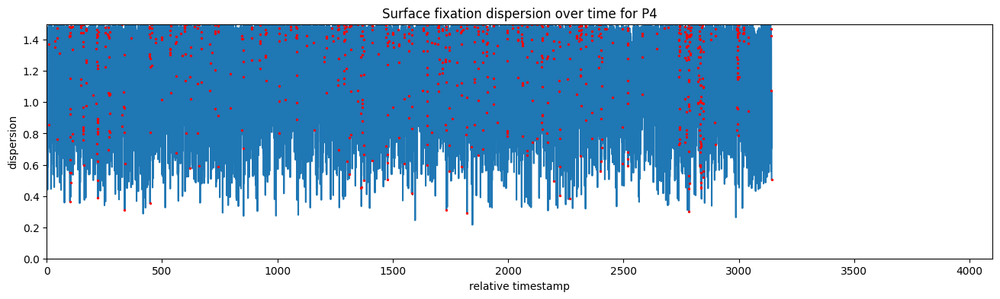

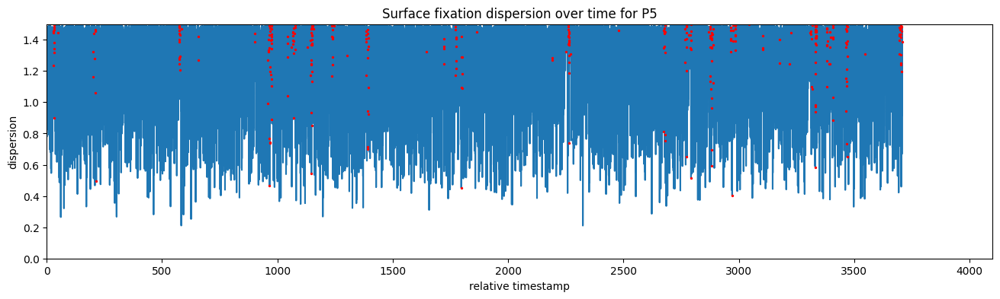

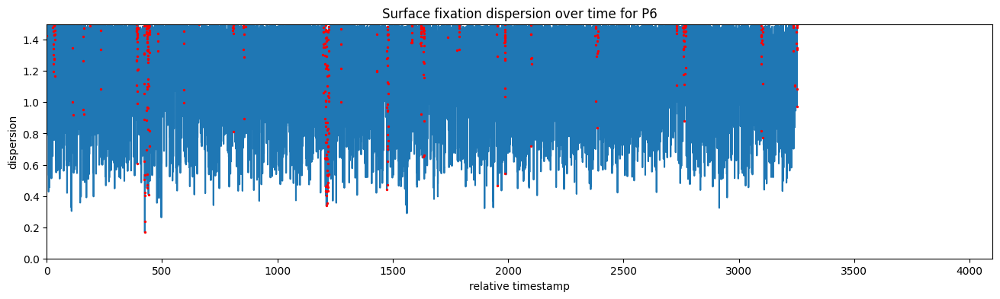

...

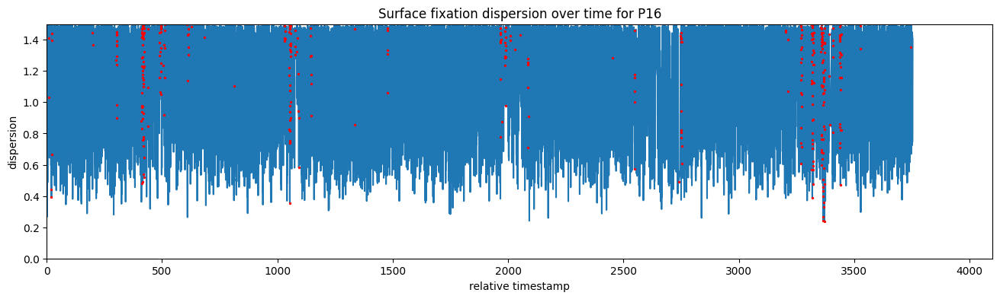

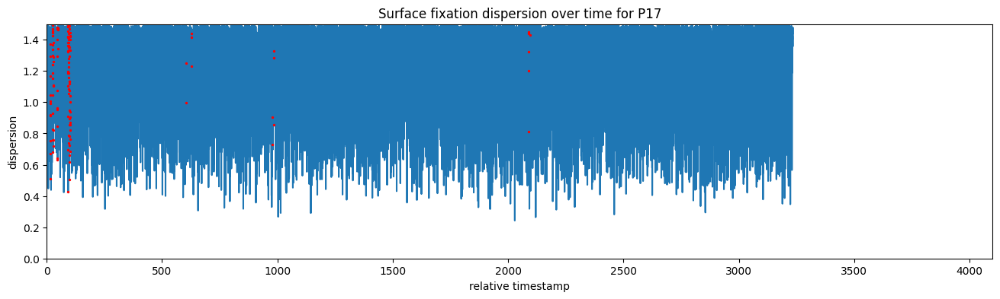

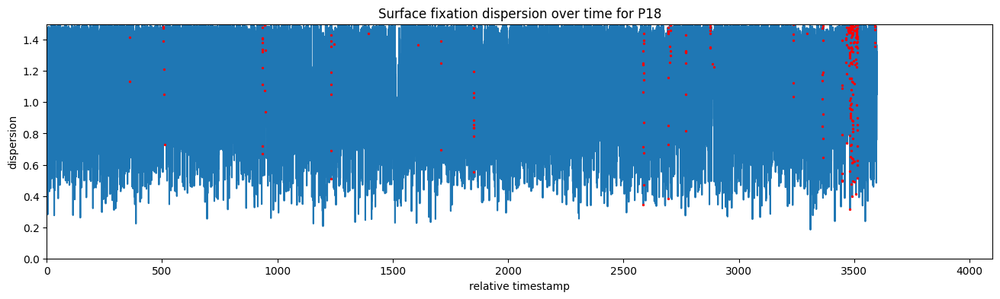

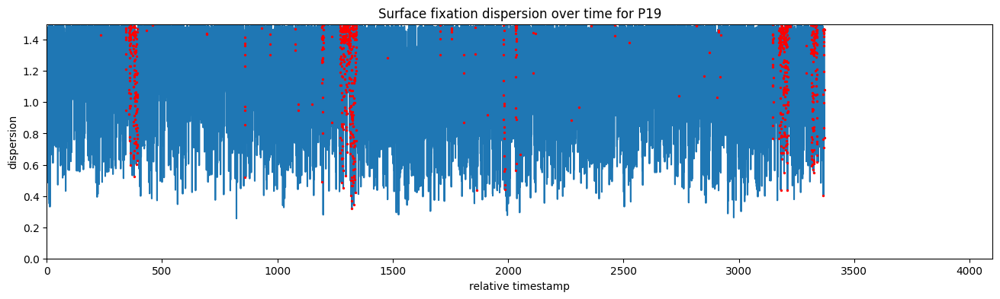

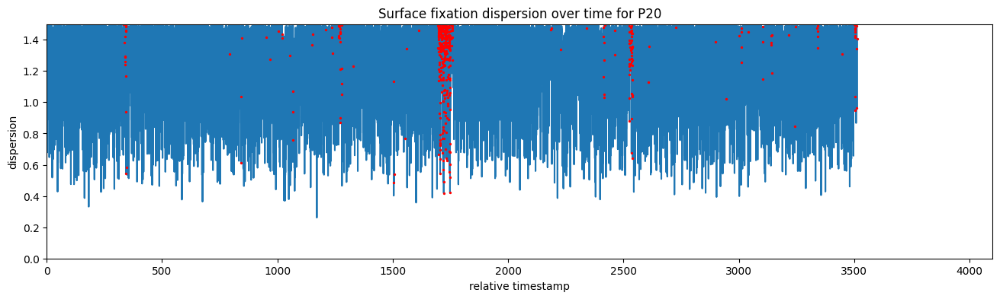

In [70]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    off_surface = participant_df[participant_df['on_surf'] == False]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['dispersion'])
    plt.scatter(off_surface['relative_timestamp'], off_surface['dispersion'], color='red', s=2, label='off_surface', zorder=2)
    plt.title(f'Surface fixation dispersion over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('dispersion')
    plt.xlim(0, 4100)
    plt.ylim(0, 1.5)
    plt.show()

##### Normalized position over time
- Questionnaires might be detectable by smaller position changes over time (in some participants, ex. P4, P5, P18)
- Not useful to plot off_surface

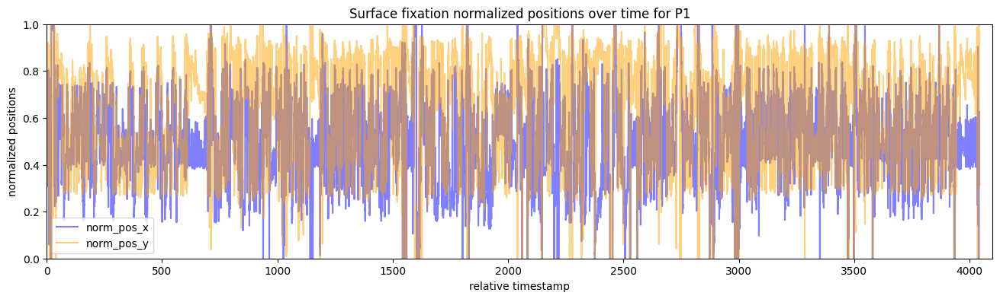

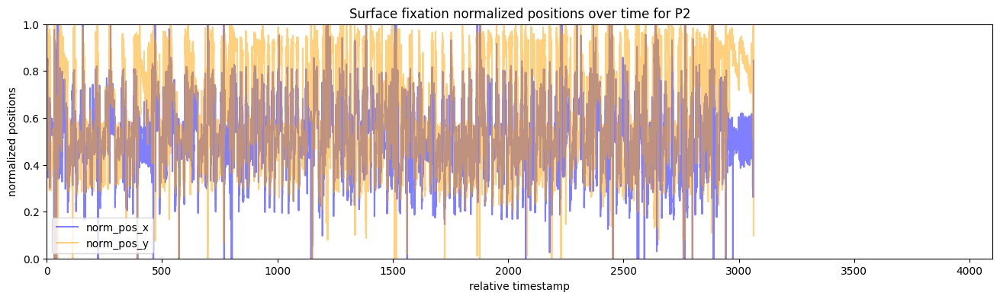

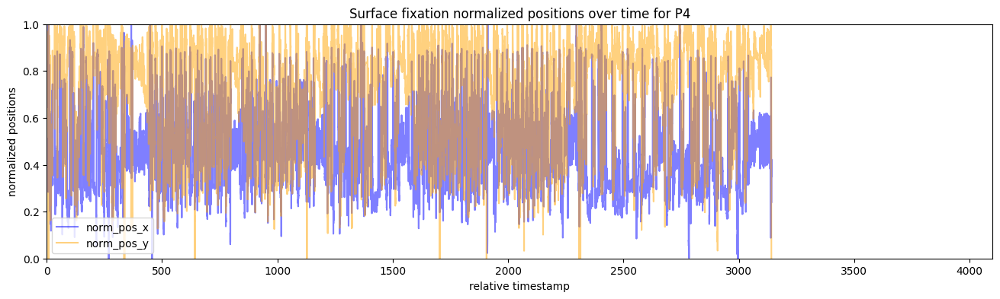

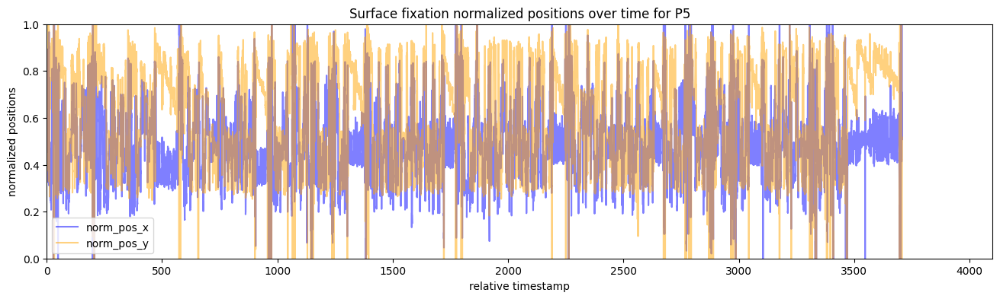

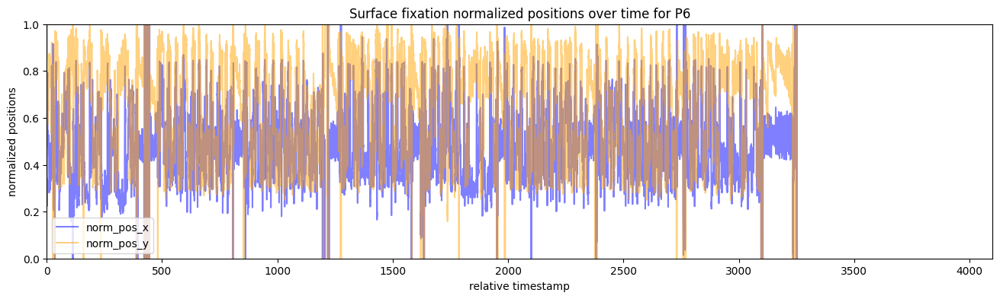

...

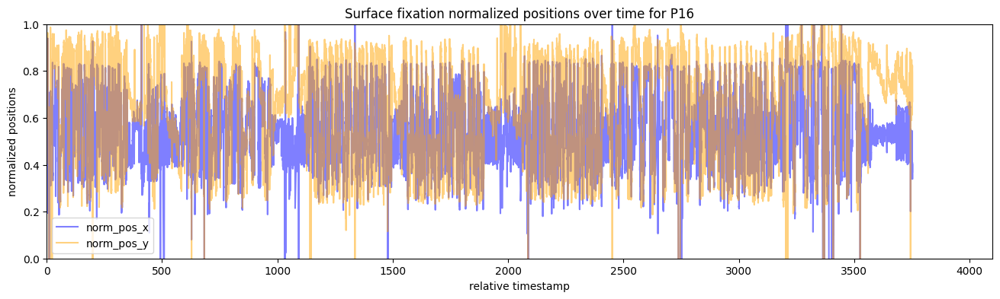

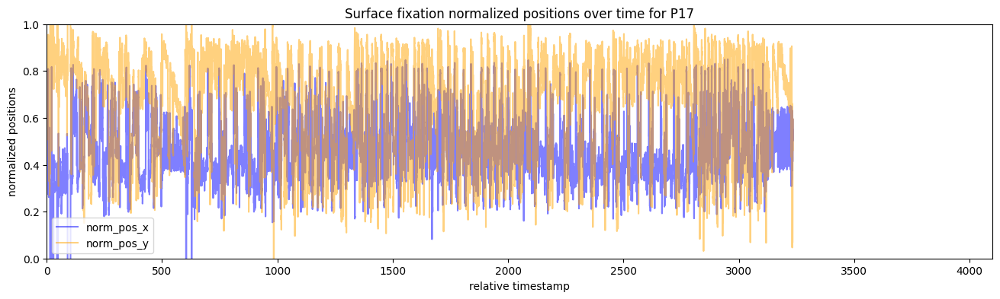

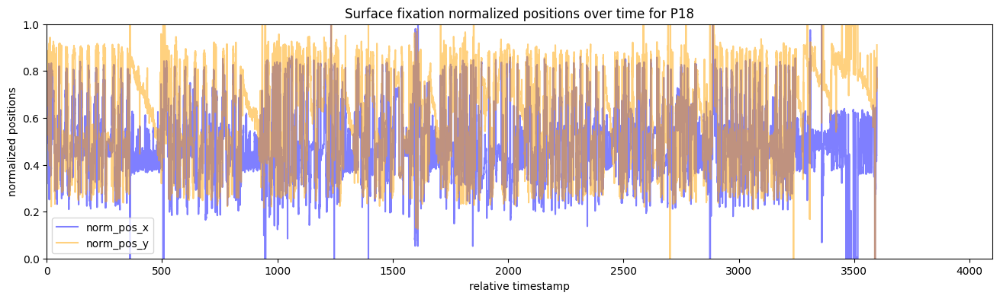

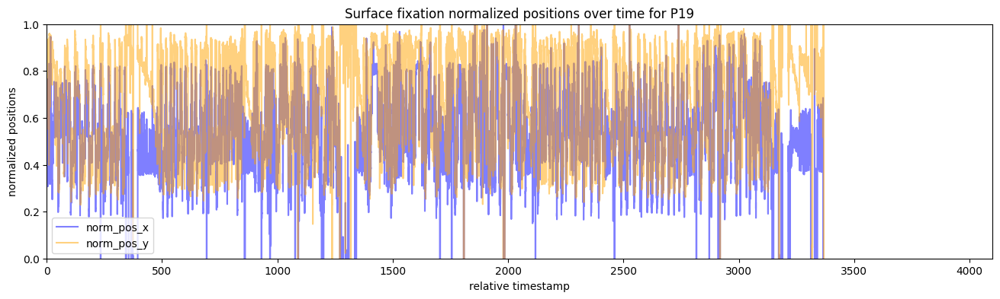

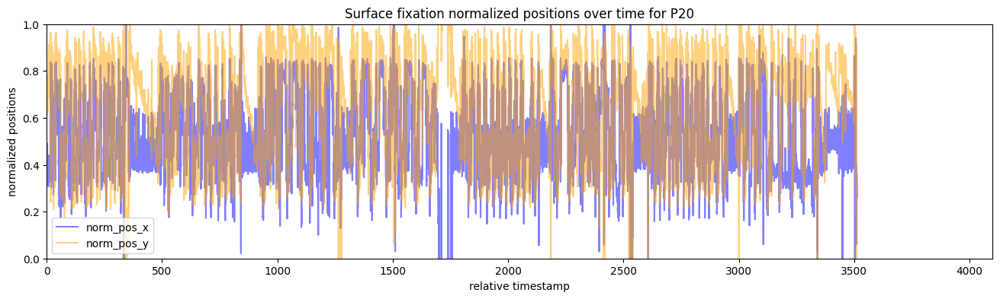

In [71]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_x'], alpha = 0.5, color='blue', label='norm_pos_x')
    plt.plot(participant_df['relative_timestamp'], participant_df['norm_pos_y'], alpha = 0.5, color='orange', label='norm_pos_y')
    plt.title(f'Surface fixation normalized positions over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('normalized positions')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.legend(loc='lower left')
    plt.show()

##### Occurences
- Some concentrations of fixations (questionnaires?)

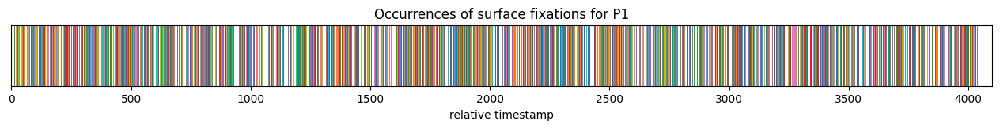

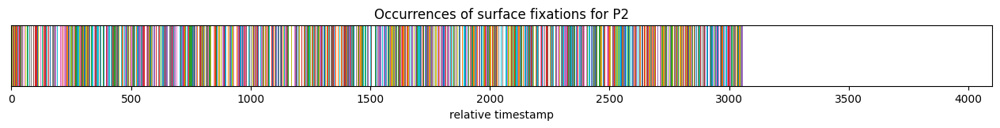

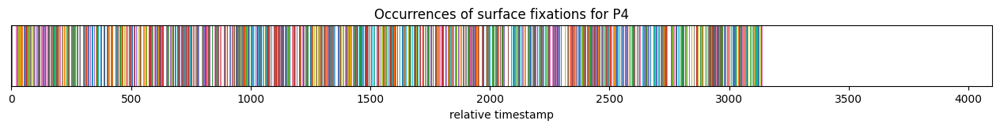

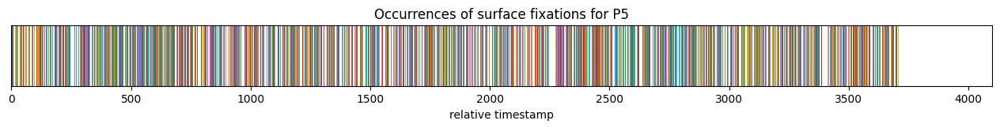

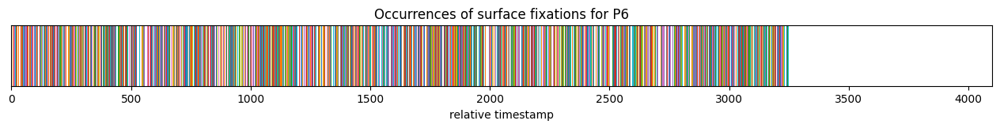

...

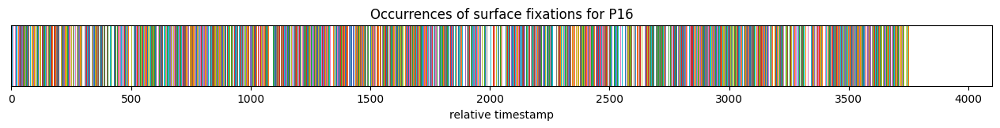

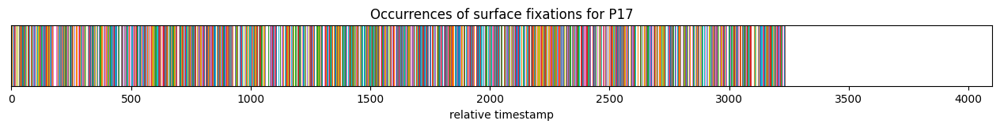

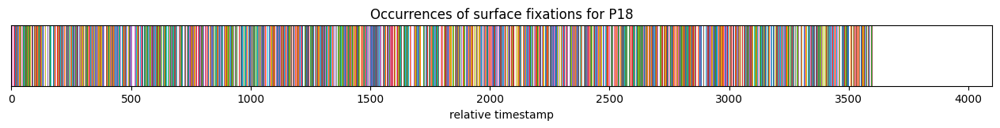

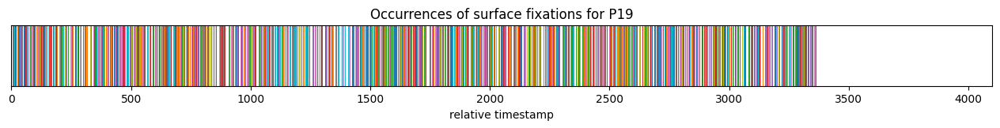

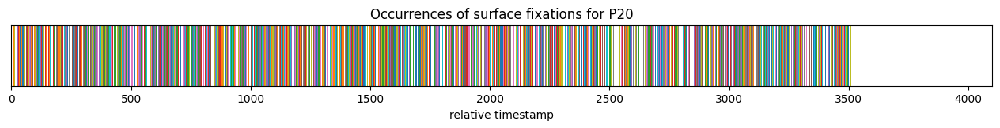

In [76]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 1))
    for _, row in participant_df.iterrows():
        start = row['relative_timestamp']
        duration = row['duration']/1000 #from [ms] to [s]
        plt.bar(start, 0.5, duration, align='edge')
    plt.title(f'Occurrences of surface fixations for P{pid}')
    plt.xlabel('relative timestamp')
    plt.xlim(0, 4100)
    plt.ylim(0, 0.5)
    plt.gca().get_yaxis().set_visible(False)
    plt.show()

##### Off-screen occurences
- Multiple off-surface fixations, what happen? (artifact?)

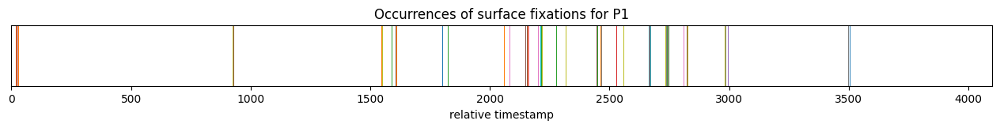

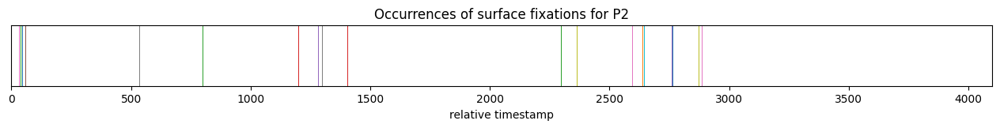

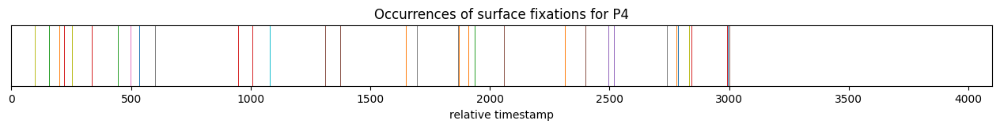

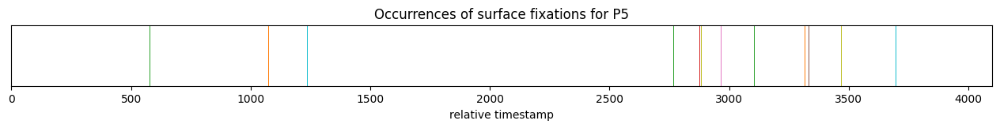

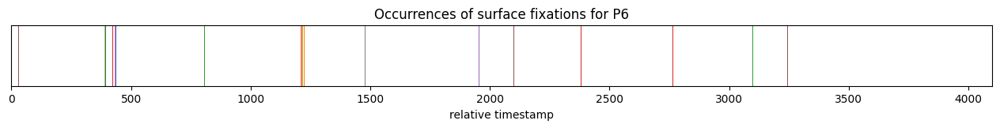

...

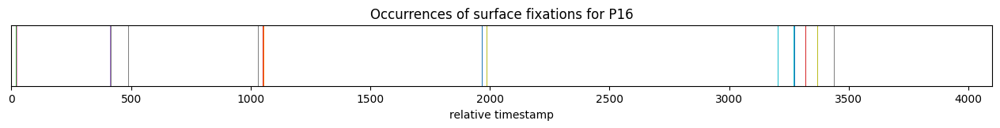

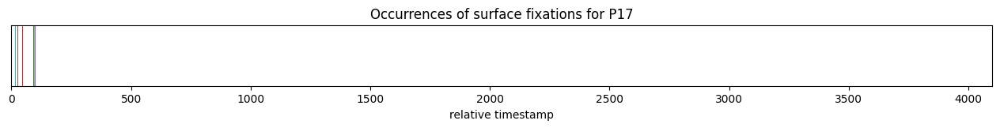

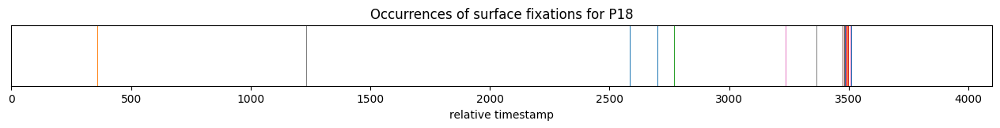

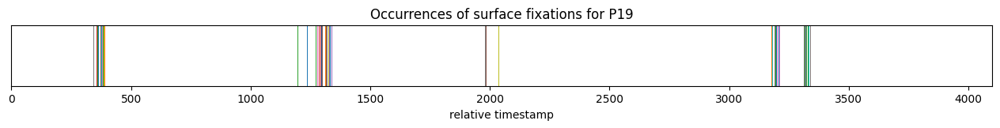

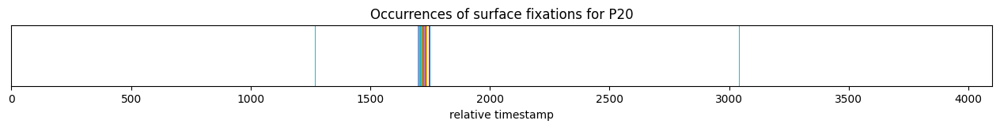

In [73]:
for pid in participant_ids:
    participant_off_df = df[(df['participant_id'] == pid) & (df['on_surf'] == False)]
    plt.figure(figsize=(16, 1))
    for _, row in participant_off_df.iterrows():
        start = row['relative_timestamp']
        duration = row['duration']/1000 #from [ms] to [s]
        plt.bar(start, 0.5, duration, align='edge')
    plt.title(f'Occurrences of surface fixations for P{pid}')
    plt.xlabel('relative timestamp')
    plt.xlim(0, 4100)
    plt.ylim(0, 0.5)
    plt.gca().get_yaxis().set_visible(False)
    plt.show()